# **4. Databases and RDS on AWS**

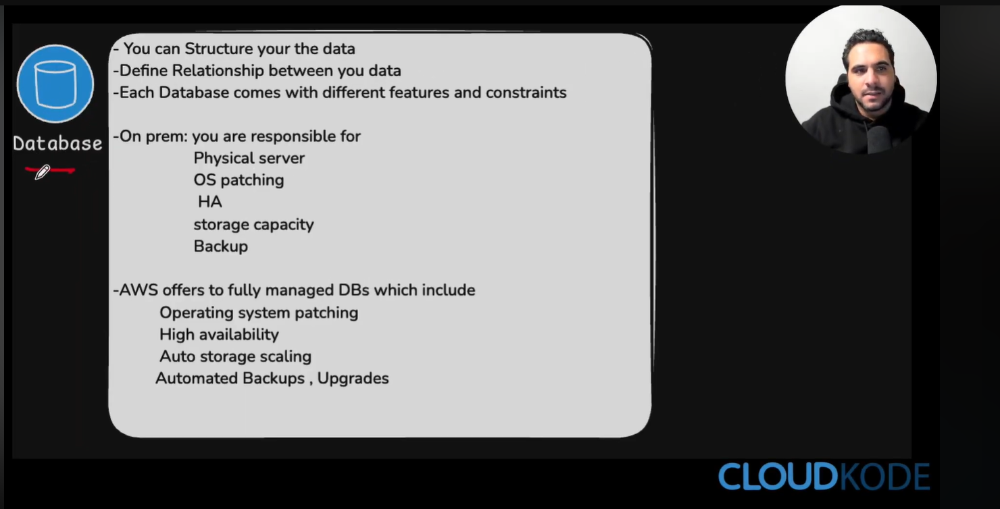



## 4.1 What Is a Database?

A database stores, organizes, retrieves, and updates application data.

Examples include:

- User accounts
- Products and orders
- Employee records
- Financial transactions
- Application settings

AWS offers both relational and non-relational database services.

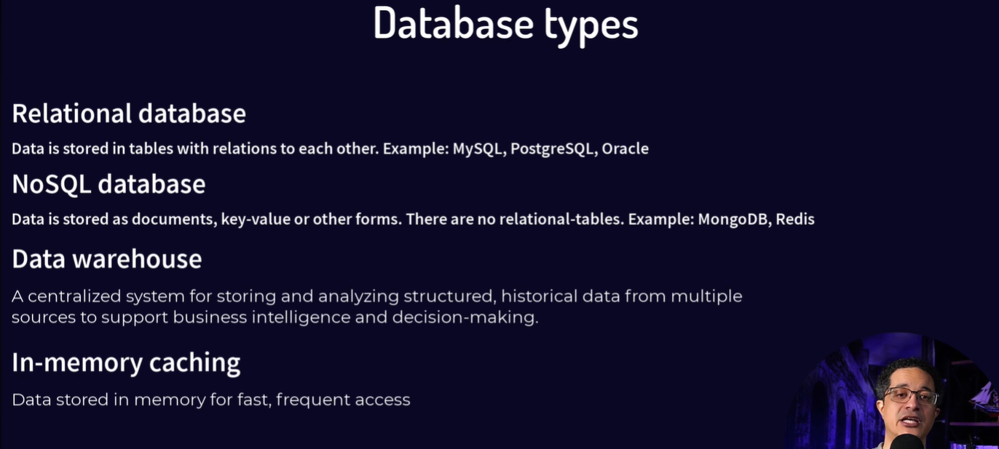

---

## 4.2 AWS Database Services

| AWS service | Database type | Common use |
|---|---|---|
| Amazon RDS | Relational | Traditional applications and structured data |
| Amazon Aurora | Relational | High-performance MySQL/PostgreSQL-compatible applications |
| Amazon DynamoDB | NoSQL key-value | Serverless applications and high-scale workloads |
| Amazon ElastiCache | In-memory | Caching and session storage |
| Amazon Redshift | Data warehouse | Analytics and business intelligence |
| Amazon DocumentDB | Document | MongoDB-compatible document workloads |
| Amazon Neptune | Graph | Relationships, recommendations and fraud detection |
| Amazon Timestream | Time series | IoT and operational metrics |

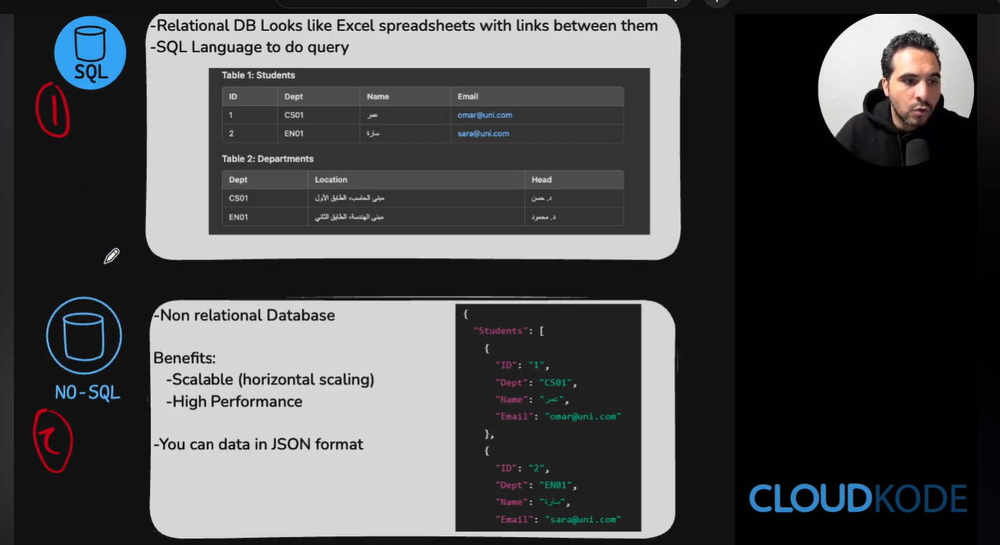

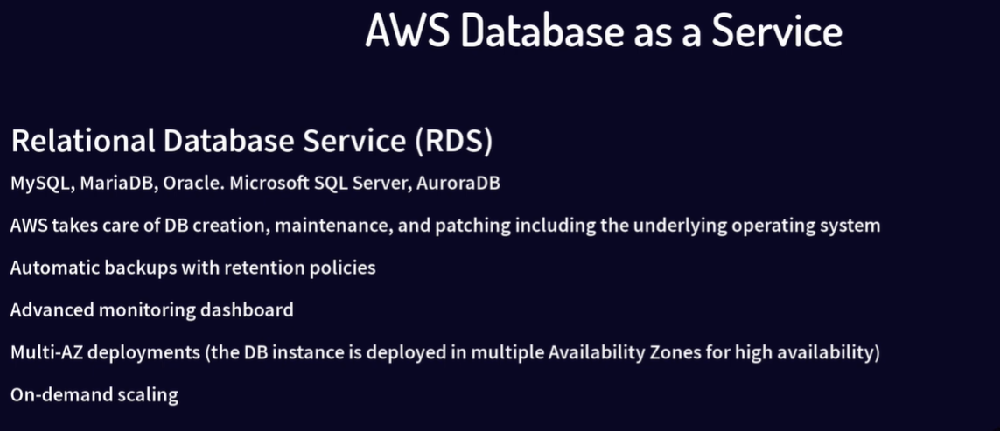

---

## 4.3 What Is Amazon RDS?

Amazon Relational Database Service—or **Amazon RDS**—is a managed service for running relational databases.


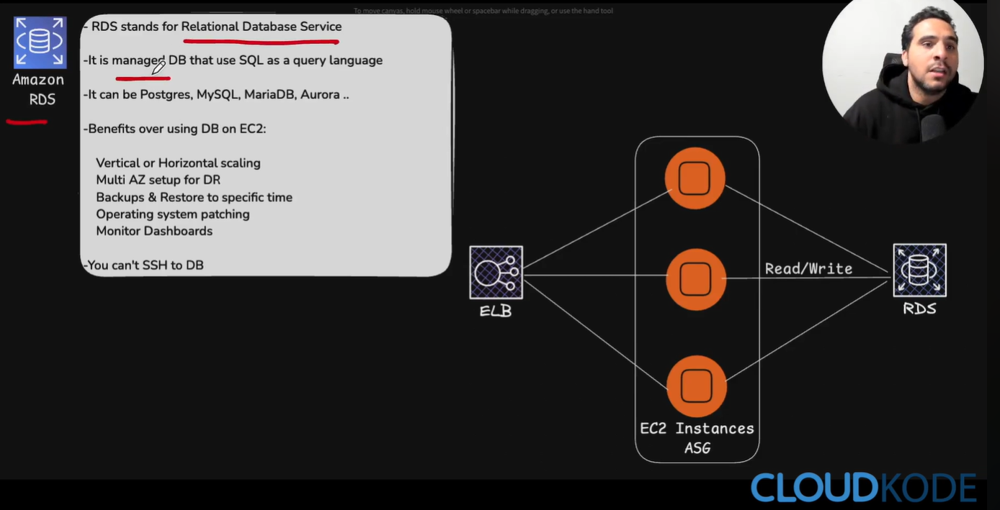

AWS manages much of the infrastructure work, including:

- Server provisioning
- Operating-system maintenance
- Database software installation
- Automated backups
- Software patching
- Monitoring
- Hardware replacement
- High-availability failover

You remain responsible for:

- Designing databases and tables
- Managing database users
- Writing SQL
- Controlling database permissions
- Selecting capacity and storage
- Securing application connections
- Optimizing queries


## 4.4 Supported RDS Database Engines

Amazon RDS supports:

- MySQL
- PostgreSQL
- MariaDB
- Oracle Database
- Microsoft SQL Server
- IBM Db2
- Amazon Aurora MySQL-Compatible
- Amazon Aurora PostgreSQL-Compatible

Feature availability can differ between database engines, versions, and AWS Regions.


###### 4.5 Relational Database Structure

Relational databases organize data into tables:

```text
Database
└── Tables
    ├── Columns
    └── Rows
```

Example:

| customer_id | customer_name | country |
|---:|---|---|
| 1 | Ahmed | Egypt |
| 2 | Sara | UAE |

Tables can be connected using:

- Primary keys
- Foreign keys
- Relationships
- Constraints

Applications normally interact with relational databases using SQL.


## 4.6 RDS Main Components

### DB instance

The compute environment running the selected database engine.

Example instance classes:

- `db.t3.micro`
- `db.t4g.micro`
- `db.m6g.large`

The instance class determines CPU, memory, networking, and performance capacity.

### Storage

Storage holds database files, transaction logs, and other database data.

Common options include:

- General Purpose SSD
- Provisioned IOPS SSD
- Magnetic storage for some legacy use cases

### Endpoint

An endpoint is the DNS address used to connect to the database.

Example:

```text
mydatabase.abc123.us-east-1.rds.amazonaws.com
```

Applications should use the endpoint—not a fixed IP address—because the underlying IP can change.

### Port

The network port depends on the database engine:

| Engine | Default port |
|---|---:|
| PostgreSQL | 5432 |
| MySQL/MariaDB/Aurora MySQL | 3306 |
| Microsoft SQL Server | 1433 |
| Oracle | 1521 |
| Db2 | 50000 |

### DB subnet group

A DB subnet group is a collection of VPC subnets where RDS is allowed to place database resources.

An RDS DB subnet group normally needs subnets in at least two Availability Zones.

### Security group

A security group is a virtual firewall controlling traffic that can reach the database.


## 4.7 Recommended Architecture

```text
Internet
   │
Internet Gateway
   │
Public subnet
   │
EC2 application server
   │
Private VPC connection
   │
Private database subnets
   │
Amazon RDS
```


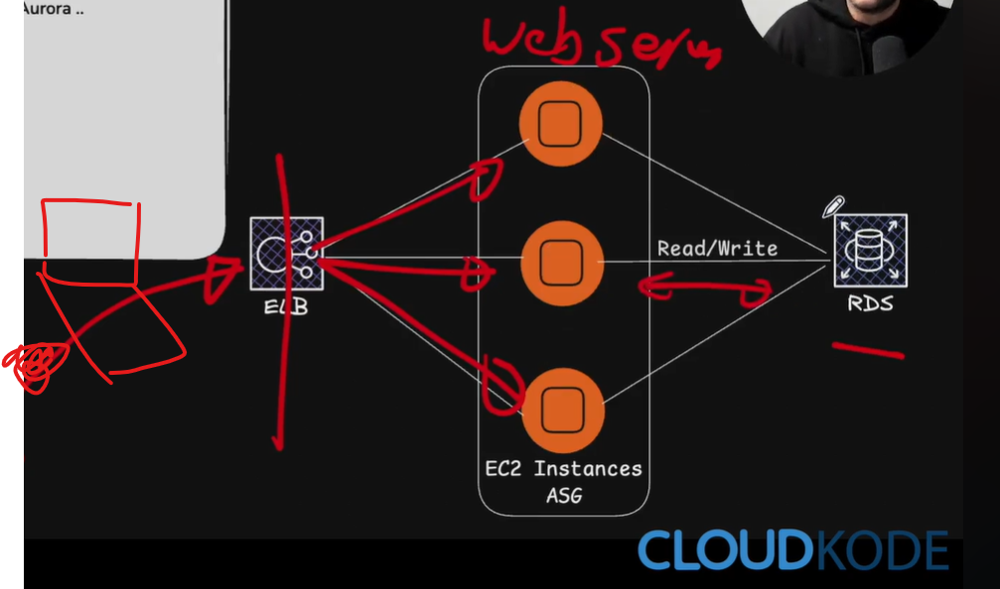



Recommended configuration:

- EC2 can be placed in a public subnet when it must receive internet traffic.
- RDS should normally be placed in private subnets.
- Set **Public access** for RDS to **No**.
- The RDS security group should allow database traffic only from the EC2 security group.

Keeping RDS private reduces exposure because it cannot be reached directly from the internet.


### RDS Deployment Options

- Single-AZ: One database instance in one Availability Zone. Suitable for development and testing but has lower availability.

- Multi-AZ DB Instance: A primary database and a standby copy in another Availability Zone. RDS automatically fails over to the standby if the primary fails. Used for high availability, not read scaling.

- Multi-AZ DB Cluster: One writer and two readable instances across three Availability Zones. Provides high availability and additional read capacity.

- Read Replica: A read-only copy of the primary database. Used to improve read performance and can also be created in another AWS Region. It is not a replacement for Multi-AZ.

| Deployment        | Main purpose                             |
| ----------------- | ---------------------------------------- |
| Single-AZ         | Low-cost development and testing         |
| Multi-AZ instance | High availability and automatic failover |
| Multi-AZ cluster  | High availability plus read capacity     |
| Read Replica      | Read scaling and geographic replication  |

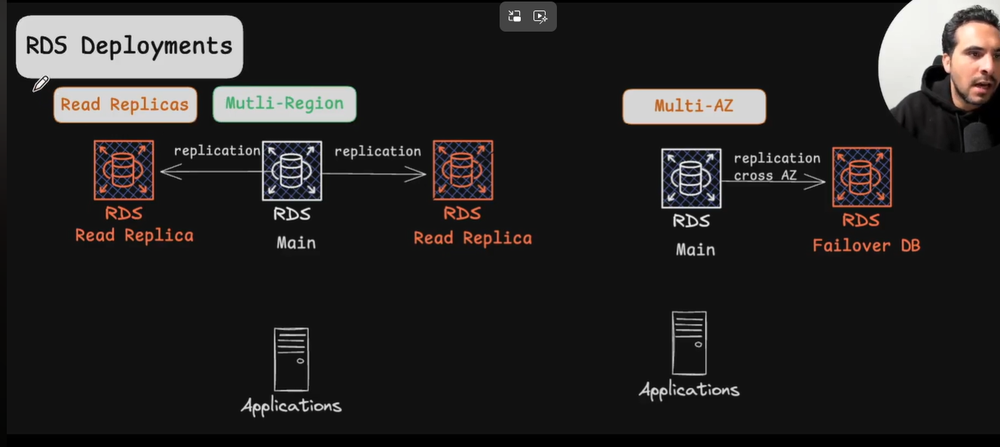



## 4.8 Security-Group Example

Assume:

- EC2 security group: `EC2-App-SG`
- RDS security group: `RDS-DB-SG`
- Database: PostgreSQL

Configure the RDS inbound rule:

| Type | Protocol | Port | Source |
|---|---|---:|---|
| PostgreSQL | TCP | 5432 | `EC2-App-SG` |

For MySQL:

| Type | Protocol | Port | Source |
|---|---|---:|---|
| MySQL/Aurora | TCP | 3306 | `EC2-App-SG` |

Using the EC2 security group as the source means that instances associated with that security group can connect to RDS. You do not need to permit the EC2 public IP.

Do not use the following source for a private production database:

```text
0.0.0.0/0
```

That would allow connection attempts from anywhere if the database were publicly reachable.


## 4.9 IAM Access vs Database Access

These are different authorization layers:

| Authorization | Controls |
|---|---|
| IAM policy | Who can create, modify, stop, snapshot, or delete RDS resources through AWS |
| Security group | Which network sources can reach the database port |
| Database username/password | Who can sign in to the database |
| SQL privileges | What a connected database user can do |

Giving a person `rds:DescribeDBInstances` does not automatically allow that person to log in to PostgreSQL or MySQL.


## 4.10 Single-AZ and Multi-AZ

### Single-AZ

RDS runs one primary database instance in one Availability Zone.

Suitable for:

- Learning
- Development
- Testing
- Noncritical workloads

### Multi-AZ

RDS maintains database infrastructure across multiple Availability Zones for high availability and automatic failover.

Suitable for:

- Production
- Business-critical applications
- Workloads requiring reduced downtime

Multi-AZ is mainly an **availability and failover** solution—not simply a read-scaling solution.

Amazon RDS also offers Multi-AZ DB clusters for supported MySQL and PostgreSQL versions, with one writer and two readable instances across three Availability Zones.


## 4.11 Read Replicas

A read replica is a copy of a source database designed primarily for read workloads.

Use read replicas for:

- Reports
- Dashboards
- Read-heavy APIs
- Analytics queries
- Reducing load on the primary database

```text
Application writes
        ↓
Primary database
        ↓ Replication
Read replica
        ↑
Application reads
```

Important distinction:

| Feature | Main purpose |
|---|---|
| Multi-AZ | High availability and failover |
| Read replica | Read scaling |
| Backup | Recovery from data loss or corruption |


## 4.12 Backups and Snapshots

### Automated backups

RDS automatically creates backups during a defined backup window when automated backups are enabled.

They support point-in-time recovery within the configured retention period.

### Manual snapshots

You create these manually.

They remain until you explicitly delete them, even after deleting the original DB instance.

### Final snapshot

When deleting an RDS instance, AWS can create a final manual snapshot before deleting the database.

| Backup type | Created by | Deleted automatically |
|---|---|---|
| Automated backup | RDS | Based on retention settings |
| Manual snapshot | User | No |
| Final snapshot | Optional during deletion | No |


## 4.13 Encryption

RDS security can include:

- Encryption at rest using AWS KMS
- Encryption in transit using SSL/TLS
- Secrets stored in AWS Secrets Manager
- Automatic password rotation
- IAM database authentication for supported engines
- CloudTrail auditing of RDS API activity

Do not store database passwords directly inside:

- Application source code
- GitHub repositories
- EC2 user data
- Public environment files

Use AWS Secrets Manager or another protected secret-management system.


## 4.14 RDS Pricing Components

RDS charges can include:

- DB instance running time
- Provisioned storage
- Provisioned IOPS
- Backup storage
- Manual snapshots
- Data transfer
- Additional monitoring
- Multi-AZ resources
- Read replicas

Stopping a development RDS instance can reduce compute cost, but storage and backup charges can continue.


## 4.15 Practical Example: EC2 Connecting to PostgreSQL RDS

### Step 1: Prepare the VPC

Create or use a VPC containing:

- One public subnet for EC2
- Two private subnets in different Availability Zones for RDS
- An Internet Gateway for the public subnet

### Step 2: Create the EC2 security group

Create:

```text
EC2-App-SG
```

Inbound rules:

| Type | Port | Source |
|---|---:|---|
| SSH | 22 | My IP |
| HTTP | 80 | Anywhere IPv4, if hosting a website |

### Step 3: Create the RDS security group

Create:

```text
RDS-PostgreSQL-SG
```

Inbound rule:

| Type | Port | Source |
|---|---:|---|
| PostgreSQL | 5432 | `EC2-App-SG` |

### Step 4: Create the DB subnet group

Open:

```text
RDS → Subnet groups → Create DB subnet group
```

Add the two private subnets from different Availability Zones.

### Step 5: Create the PostgreSQL database

Open:

```text
RDS → Databases → Create database
```

Select:

- Creation method: Standard create
- Engine: PostgreSQL
- Template: Free tier or development/testing, when eligible
- Availability: Single DB instance for training
- DB identifier: `training-postgres`
- Master username: `postgresadmin`
- Credentials: Manage through Secrets Manager if available
- VPC: Same VPC as EC2
- DB subnet group: Private DB subnet group
- Public access: No
- Security group: `RDS-PostgreSQL-SG`
- Port: `5432`
- Initial database name: `trainingdb`

### Step 6: Retrieve the endpoint

After the database becomes available, open:

```text
RDS → Databases → training-postgres → Connectivity & security
```

Copy:

- Endpoint
- Port

### Step 7: Install the PostgreSQL client on Amazon Linux

Connect to EC2 and run:

```bash
sudo dnf install postgresql15 -y
```

### Step 8: Connect from EC2 to RDS

```bash
psql \
  --host=YOUR-RDS-ENDPOINT \
  --port=5432 \
  --username=postgresadmin \
  --dbname=trainingdb
```

Enter the master password when prompted.

### Step 9: Create a test table

```sql
CREATE TABLE employees (
    employee_id SERIAL PRIMARY KEY,
    employee_name VARCHAR(100) NOT NULL,
    department VARCHAR(100)
);
```

### Step 10: Insert test data

```sql
INSERT INTO employees (employee_name, department)
VALUES
    ('Ahmed', 'Engineering'),
    ('Sara', 'Data Analytics');
```

### Step 11: Read the data

```sql
SELECT * FROM employees;
```

Expected result:

| employee_id | employee_name | department |
|---:|---|---|
| 1 | Ahmed | Engineering |
| 2 | Sara | Data Analytics |


## 4.16 Key Exam and Interview Points

- RDS is a managed relational database service.
- RDS is not a database engine itself.
- RDS should normally be private.
- Applications connect using the RDS endpoint.
- Security groups control network access.
- Database credentials control database login.
- Multi-AZ provides high availability.
- Read replicas provide read scaling.
- Automated backups support point-in-time recovery.
- Manual snapshots remain until deleted.
- A DB subnet group normally covers at least two Availability Zones.
- EC2 and RDS should normally use separate security groups.
- The RDS security group should reference the EC2 security group as its source.



---

## 4.17 Amazon Aurora

Amazon Aurora is a fully managed relational database engine provided through Amazon RDS. It is compatible with:

- MySQL
- PostgreSQL

Existing MySQL and PostgreSQL tools, drivers, and applications can generally work with Aurora.


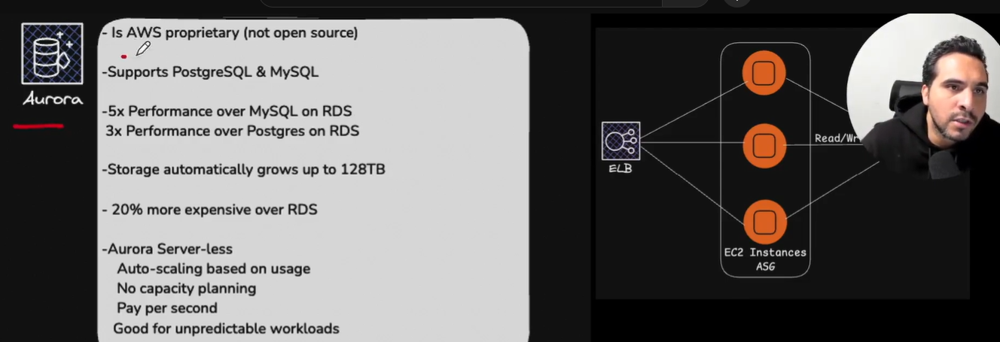


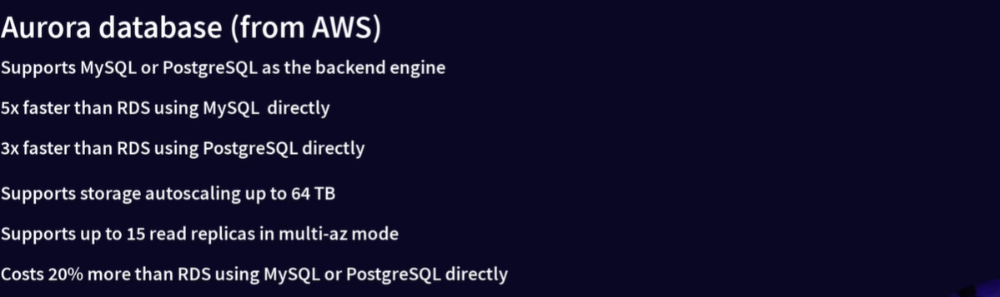

### Aurora Architecture

An Aurora cluster normally contains:

- **Writer instance:** Handles read and write operations.
- **Reader instances:** Handle read operations and improve availability.
- **Shared cluster storage:** Used by the writer and all Aurora replicas.
- **Cluster endpoint:** Sends connections to the writer.
- **Reader endpoint:** Distributes read connections across available replicas.

```text
Application writes
        ↓
Cluster endpoint
        ↓
Writer instance
        ↓
Shared Aurora storage
        ↑
Reader instances
        ↑
Reader endpoint
        ↑
Application reads
```

### Main Aurora Features

- Compatible with MySQL and PostgreSQL.
- Storage automatically grows according to database requirements.
- Data is copied across multiple Availability Zones.
- Supports automatic backups and point-in-time recovery.
- Supports automatic failover.
- Supports up to 15 Aurora replicas.
- Reader endpoint supports read scaling.
- Supports Aurora Serverless for workloads with changing demand.
- Supports Aurora Global Database for multi-Region applications.

Aurora stores copies of cluster data across multiple Availability Zones. If the writer fails, an Aurora replica can be promoted to become the new writer.

### Aurora Deployment Options

| Deployment | Description |
|---|---|
| Aurora provisioned | You select and manage the database instance classes |
| Aurora Serverless | Database capacity automatically adjusts with demand |
| Aurora Global Database | Uses multiple AWS Regions for global reads and disaster recovery |
| Aurora I/O-Optimized | Designed for workloads with high database I/O usage |

### Aurora vs Standard RDS

| Feature | Standard RDS | Amazon Aurora |
|---|---|---|
| Supported engines | Multiple database engines | MySQL and PostgreSQL compatible |
| Storage architecture | Storage belongs to each DB instance | Distributed storage shared by the cluster |
| Read replicas | Depends on selected engine | Up to 15 Aurora replicas |
| Failover | Multi-AZ standby or cluster | Aurora replica can be promoted |
| Scaling | Instance and storage scaling | Instance, replica and automatic storage scaling |
| Best use | General relational workloads | High-performance and highly available applications |
| Cost | Usually lower for small workloads | Can cost more but provides advanced capabilities |

### When to Use Aurora

Use Aurora when you need:

- High database performance
- High availability
- Fast automatic failover
- Multiple read replicas
- Automatic storage growth
- MySQL or PostgreSQL compatibility
- Global database access
- Serverless database capacity

---

## 4.18 Amazon ElastiCache

Amazon ElastiCache is a managed in-memory data store and caching service.

It stores frequently accessed data in memory instead of repeatedly retrieving it from a slower database.

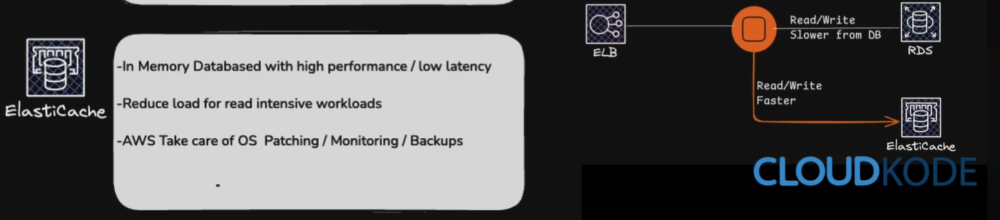

ElastiCache supports:

- Valkey
- Redis OSS
- Memcached





### How ElastiCache Works

Without caching:

```text
Application → Database → Return data
Application → Database → Return the same data again
```

With ElastiCache:

```text
Application → ElastiCache
                    │
              Data available?
               │           │
              Yes          No
               │           │
         Return data    Read database
                            │
                       Store in cache
                            │
                       Return data
```

The application normally follows these steps:

1. Check whether the requested data exists in ElastiCache.
2. If it exists, return it directly from memory.
3. If it does not exist, retrieve it from the main database.
4. Store a temporary copy in ElastiCache.
5. Return the data to the user.

### Common Use Cases

ElastiCache can be used for:

- Database query caching
- Application session storage
- Shopping carts
- Frequently viewed products
- User profiles
- API response caching
- Leaderboards
- Real-time analytics
- Rate limiting
- Pub/Sub messaging

### ElastiCache Engines

| Feature | Valkey/Redis OSS | Memcached |
|---|---|---|
| Data structures | Advanced data structures | Simple key-value data |
| Replication | Supported | Not supported |
| Automatic failover | Supported with suitable configuration | Not supported |
| Persistence options | Supported | Not supported |
| Pub/Sub | Supported | Not supported |
| Multi-AZ | Supported | Data distributed across nodes |
| Typical use | Sessions, leaderboards and advanced caching | Simple distributed caching |

### ElastiCache Deployment Options

| Deployment | Description |
|---|---|
| Serverless cache | AWS automatically manages and scales cache capacity |
| Node-based cluster | You choose the node type, number of nodes and cluster configuration |

### ElastiCache and RDS Together

ElastiCache does not normally replace RDS.

RDS remains the permanent database, while ElastiCache holds temporary, frequently accessed data.

```text
Users
  ↓
Application on EC2
  ↓
ElastiCache ← Fast temporary data
  ↓ Cache miss
Amazon RDS ← Permanent source of data
```

### RDS vs ElastiCache

| Feature | Amazon RDS | Amazon ElastiCache |
|---|---|---|
| Main purpose | Permanent relational data storage | Fast temporary in-memory storage |
| Storage location | Database storage | Memory |
| Data persistence | Primary purpose | Depends on engine and configuration |
| Query method | SQL | Key-based commands and data structures |
| Speed | Fast | Extremely fast |
| Typical use | Customers, orders and transactions | Sessions, repeated queries and temporary data |
| Replaces the other service | No | No |

### Example

Suppose an application repeatedly requests product details.

Without ElastiCache:

```text
1,000 requests → 1,000 RDS queries
```

With ElastiCache:

```text
First request → Read from RDS and save in ElastiCache
Next requests → Read from ElastiCache
```

This provides:

- Faster application responses
- Fewer database queries
- Reduced load on RDS
- Better scalability

### Important Point

Because cached data can become outdated, the application must define:

- Cache expiration time
- Cache invalidation rules
- What happens when the cache is unavailable
- Which data should and should not be cached

Sensitive or critical data should not depend only on the cache.


---


## 4.19 Amazon DynamoDB

Amazon DynamoDB is a fully managed, serverless NoSQL database that provides single-digit millisecond performance at scale.

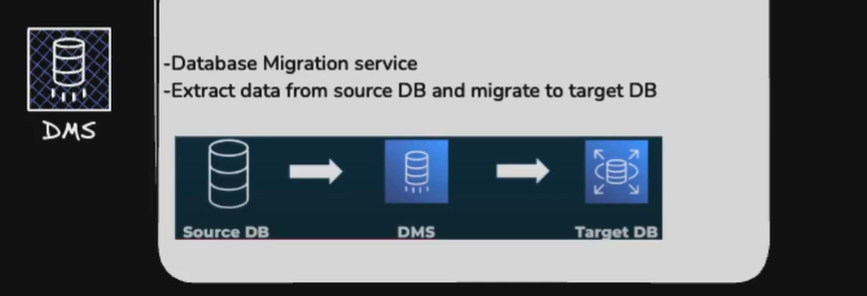

It supports two data models:

- Key-value
- Document

DynamoDB does not require database servers or instances to be provisioned and managed.


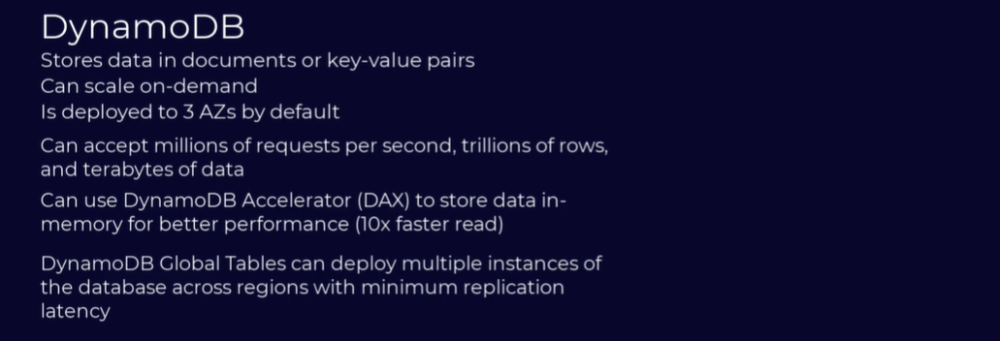

### DynamoDB Data Structure

```text
Table
 └── Item
      ├── Attribute
      ├── Attribute
      └── Attribute
```

The DynamoDB structure corresponds approximately to:

| Relational database | DynamoDB |
|---|---|
| Table | Table |
| Row | Item |
| Column | Attribute |
| Primary key | Partition key or composite key |

### Example Item

```json
{
  "CustomerID": "C001",
  "Name": "Ahmed",
  "Country": "Egypt",
  "Orders": 5
}
```

Unlike relational tables, items in the same DynamoDB table do not always need to contain exactly the same attributes.

### Primary Keys

Every DynamoDB item must be uniquely identified by a primary key.

#### Partition Key

Uses one attribute:

```text
CustomerID = C001
```

The partition key determines how DynamoDB distributes data internally.

#### Composite Primary Key

Uses two attributes:

```text
Partition key: CustomerID
Sort key: OrderDate
```

Example:

| CustomerID | OrderDate | Product |
|---|---|---|
| C001 | 2026-09-01 | Laptop |
| C001 | 2026-09-05 | Monitor |
| C002 | 2026-09-02 | Keyboard |

The partition key can contain repeated values, but the combination of partition key and sort key must be unique.

### Capacity Modes

| Mode | Description |
|---|---|
| On-demand | DynamoDB automatically handles capacity and charges per request |
| Provisioned | You specify the required read and write capacity |
| Provisioned with Auto Scaling | Capacity automatically adjusts within configured limits |

### Important DynamoDB Features

- Serverless operation
- Automatic scaling
- Low-latency access
- Encryption at rest
- Point-in-time recovery
- Backup and restore
- Global and local secondary indexes
- DynamoDB Streams
- Transactions
- Time to Live
- Global tables
- Integration with AWS Lambda

### Secondary Indexes

Indexes provide alternative ways to query table data.

| Index | Description |
|---|---|
| Global Secondary Index | Can use a different partition key and sort key |
| Local Secondary Index | Uses the same partition key but a different sort key |

### DynamoDB Streams

DynamoDB Streams records item-level changes, such as:

- Insert
- Update
- Delete

A Lambda function can process those changes.

```text
DynamoDB change
       ↓
DynamoDB Stream
       ↓
AWS Lambda
       ↓
Perform another action
```

### Global Tables

Global tables replicate DynamoDB table data across multiple AWS Regions.

They provide:

- Multi-Region availability
- Local read and write performance
- Disaster-recovery support
- Multi-active database access

### Common Use Cases

Use DynamoDB for:

- Serverless applications
- Shopping carts
- Gaming leaderboards
- User sessions
- IoT applications
- High-traffic web applications
- Product catalogs
- Real-time applications

### When Not to Use DynamoDB

DynamoDB might not be the best option when you need:

- Complex SQL joins
- Strong relational constraints
- Frequent ad-hoc queries
- Traditional relational reporting
- Complex multi-table relationships

### DynamoDB vs RDS

| Feature | DynamoDB | RDS |
|---|---|---|
| Database type | NoSQL | Relational |
| Query method | API, SDK or PartiQL | SQL |
| Schema | Flexible | Structured |
| Server management | Serverless | Managed DB instances |
| Joins | Not supported like SQL joins | Supported |
| Scaling | Automatic or configured capacity | Instance and storage scaling |
| Best use | High-scale key-based access | Relational applications |

---

## 4.20 Amazon DocumentDB

Amazon DocumentDB is a fully managed document database service with MongoDB compatibility.

It stores data in JSON-like documents rather than relational rows and columns.


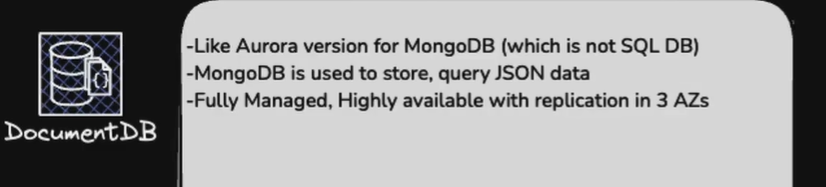

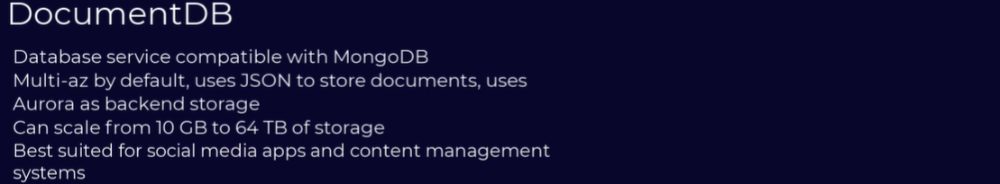




### Document Structure

```text
Cluster
 └── Database
      └── Collection
           └── Document
```

The structure corresponds approximately to:

| Relational database | DocumentDB |
|---|---|
| Database | Database |
| Table | Collection |
| Row | Document |
| Column | Field |

### Example Document

```json
{
  "_id": "P001",
  "product": "Laptop",
  "customer": {
    "name": "Ahmed",
    "country": "Egypt"
  },
  "tags": ["electronics", "computer"],
  "price": 35000
}
```

Documents can contain:

- Nested objects
- Arrays
- Different fields
- Flexible structures

### DocumentDB Architecture

An Amazon DocumentDB cluster contains:

- One primary instance for writes
- Optional replica instances for reads
- Shared distributed cluster storage
- Cluster endpoint for writes
- Reader endpoint for reads

```text
Application writes
        ↓
Cluster endpoint
        ↓
Primary instance
        ↓
Shared cluster storage
        ↑
Replica instances
        ↑
Reader endpoint
        ↑
Application reads
```

### Main Features

- MongoDB-compatible APIs and drivers
- Managed backups
- Point-in-time recovery
- Read replicas
- Automatic failover
- Encryption at rest
- TLS connections
- Automatic storage growth
- Monitoring through Amazon CloudWatch

### Important Compatibility Note

Amazon DocumentDB is MongoDB-compatible, but it is not the MongoDB database software.

Before migrating an application, verify that its required:

- MongoDB commands
- APIs
- Operators
- Data types
- Indexing features

are supported by the selected DocumentDB version.

### Common Use Cases

Use DocumentDB for:

- Content-management systems
- Product catalogs
- User profiles
- Mobile and web applications
- JSON document storage
- Applications migrated from MongoDB-compatible workloads

### DocumentDB vs DynamoDB

| Feature | DocumentDB | DynamoDB |
|---|---|---|
| Database model | Document | Key-value and document |
| Compatibility | MongoDB-compatible | AWS-native API |
| Infrastructure | Managed cluster and instances | Serverless |
| Query style | MongoDB-compatible queries | DynamoDB API or PartiQL |
| Relationships | Embedded documents and references | Access-pattern-based modeling |
| Best use | MongoDB-compatible applications | Serverless, high-scale applications |

### DocumentDB vs MongoDB

| Feature | DocumentDB | MongoDB |
|---|---|---|
| Provider | AWS | MongoDB Inc. or self-managed |
| Management | Fully managed by AWS | Self-managed or MongoDB Atlas |
| Compatibility | Supports many MongoDB APIs | Native MongoDB |
| AWS integration | Strong | Depends on deployment |
| Feature matching | Not complete | Complete native feature set |

---

## 4.21 Amazon Neptune

Amazon Neptune is a fully managed graph database service.

It is designed for data containing many complex relationships.

Instead of focusing only on rows or documents, a graph database stores:

- Nodes or vertices
- Edges or relationships
- Properties

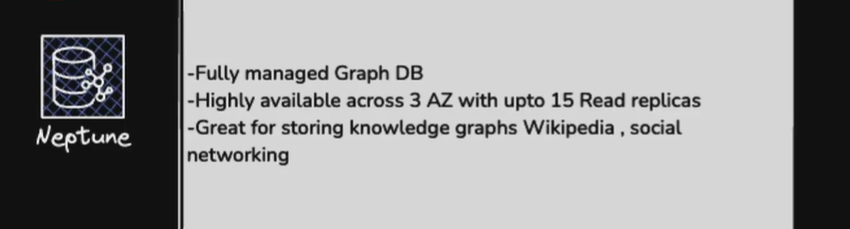

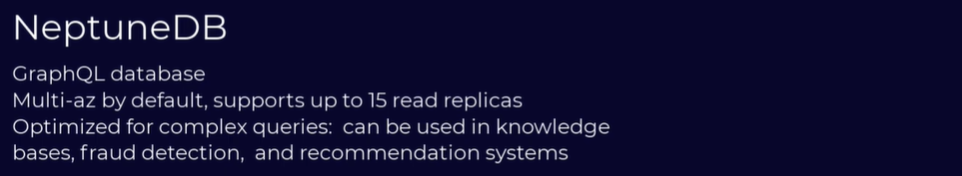


### Graph Example

```text
(Ahmed) ──WORKS_AT──> (Company)
    │
    └──KNOWS──> (Sara)
                   │
                   └──PURCHASED──> (Product)
```

In this example:

- `Ahmed`, `Sara`, `Company`, and `Product` are nodes.
- `WORKS_AT`, `KNOWS`, and `PURCHASED` are relationships.
- Names, dates, and prices can be properties.

### Supported Graph Models

Amazon Neptune supports:

| Graph model | Query language |
|---|---|
| Property graph | Gremlin |
| Property graph | openCypher |
| RDF graph | SPARQL |

### Main Features

- Fully managed graph database
- High availability
- Read replicas
- Automatic backups
- Point-in-time recovery
- Replication across Availability Zones
- Encryption
- Support for billions of relationships
- Millisecond graph-query latency
- Neptune Global Database options
- Integration with other AWS services

### Common Use Cases

Use Neptune for:

- Social networks
- Recommendation engines
- Fraud detection
- Knowledge graphs
- Network and IT operations
- Identity graphs
- Supply-chain relationships
- Drug discovery
- Access-control relationships

### Example: Fraud Detection

```text
Customer A ──USES──> Credit Card 1
Customer B ──USES──> Credit Card 1
Customer B ──USES──> Device X
Customer C ──USES──> Device X
```

The shared credit card and device may reveal relationships that are difficult to detect using traditional tables.

### Neptune vs RDS

| Feature | Neptune | RDS |
|---|---|---|
| Database type | Graph | Relational |
| Main structure | Nodes and relationships | Tables and rows |
| Query languages | Gremlin, openCypher and SPARQL | SQL |
| Main strength | Relationship traversal | Structured relational transactions |
| Typical use | Fraud, recommendations and knowledge graphs | Business applications and transactions |

### When to Use Neptune

Use Neptune when the relationships between records are as important as the records themselves.

Do not select Neptune simply because two relational tables have a relationship. It is most useful when applications repeatedly traverse many levels of connected data.

---

## 4.22 AWS Database Migration Service (DMS)

AWS Database Migration Service—AWS DMS—is a managed service for migrating and continuously replicating data between supported data stores.

It can migrate:

- Relational databases
- Data warehouses
- NoSQL databases
- Other supported data stores

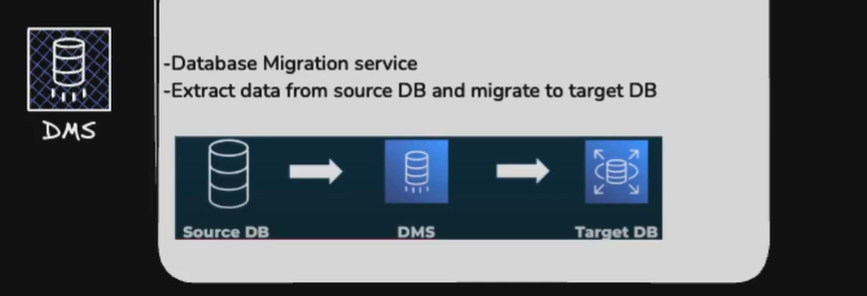


### Basic DMS Architecture

```text
Source database
       ↓
AWS DMS migration resources
       ↓
Target database
```

Example:

```text
On-premises PostgreSQL
          ↓
        AWS DMS
          ↓
Amazon RDS for PostgreSQL
```

### DMS Main Components

| Component | Purpose |
|---|---|
| Source endpoint | Connection information for the existing database |
| Target endpoint | Connection information for the destination database |
| Replication resources | Performs the data migration or replication |
| Migration task | Defines which data is moved and how |
| Table mappings | Selects schemas, tables and transformation rules |

### Migration Types

#### Full Load

Migrates all existing data from the source to the target.

```text
Existing source data → Target database
```

#### Change Data Capture

Replicates ongoing changes after replication begins.

It can capture:

- Inserts
- Updates
- Deletes

#### Full Load and CDC

First migrates existing data, then continuously replicates new changes.

```text
Full existing data
        ↓
Target database
        ↓
Continue replicating changes
```

This option is commonly used to reduce migration downtime.

### Homogeneous Migration

The source and target use the same or compatible database engines.

Examples:

```text
MySQL → Amazon RDS for MySQL
PostgreSQL → Amazon Aurora PostgreSQL
MongoDB-compatible source → Amazon DocumentDB
```

Schema changes are normally smaller because the engines are compatible.

### Heterogeneous Migration

The source and target use different database engines.

Examples:

```text
Oracle → Amazon Aurora PostgreSQL
SQL Server → Amazon RDS for MySQL
Oracle → Amazon Redshift
```

A heterogeneous migration can require schema conversion in addition to data migration.

### DMS Schema Conversion

DMS Schema Conversion helps convert database objects into a format compatible with the target engine.

It can assess or convert objects such as:

- Tables
- Views
- Indexes
- Stored procedures
- Functions
- Data types

Objects that cannot be converted automatically may require manual modification.

### Migration Process

1. Prepare the source database.
2. Prepare the target database.
3. Configure network connectivity.
4. Create the source endpoint.
5. Create the target endpoint.
6. Test both endpoint connections.
7. Configure replication resources.
8. Create the migration task.
9. Define table mappings.
10. Start the migration.
11. Monitor full-load progress.
12. Monitor ongoing replication and latency.
13. Validate the migrated data.
14. Stop application writes temporarily.
15. Allow final changes to replicate.
16. Point the application to the target database.

### Example Migration

```text
Existing on-premises MySQL database
                 ↓
         Site-to-Site VPN
                 ↓
              AWS DMS
                 ↓
        Amazon RDS for MySQL
```

The migration can use:

```text
Full load + CDC
```

Existing data is migrated first. New database changes continue to replicate until the application is switched to RDS.

### What DMS Migrates

DMS mainly migrates data.

Depending on the source, target, and migration type, you may need separate handling for:

- Database schemas
- Users
- Permissions
- Stored procedures
- Functions
- Triggers
- Application connection strings
- Engine-specific features

### DMS vs Backup and Restore

| Feature | AWS DMS | Backup and restore |
|---|---|---|
| Main purpose | Migration and continuous replication | Recovery or database copying |
| Ongoing changes | Supported with CDC | Normally not continuous |
| Different engines | Supported | Usually requires compatible engines |
| Downtime reduction | Strong capability | Depends on backup size and restore time |
| Schema conversion | Available through DMS Schema Conversion | Usually not provided |

### Common Use Cases

Use AWS DMS for:

- Moving on-premises databases to AWS
- Migrating EC2 databases to Amazon RDS
- Changing database engines
- Migrating to Amazon Aurora
- Consolidating databases
- Continuous data replication
- Reducing database migration downtime
- Sending operational data to analytics targets

### Important Point

AWS DMS does not automatically guarantee that an application will work correctly with the target database.

You must also validate:

- Database schema
- Data types
- Queries
- Stored procedures
- Application drivers
- Permissions
- Data completeness
- Application behavior


---
## 4.23 Amazon MemoryDB

Amazon MemoryDB is a fully managed, durable, in-memory database compatible with:

- Valkey
- Redis OSS

MemoryDB combines in-memory performance with durable Multi-AZ storage, allowing it to be used as a primary database.

### How MemoryDB Works

```text
Application
     ↓
MemoryDB cluster
     ├── Primary node
     ├── Replica nodes
     └── Multi-AZ transaction log
```

Data is stored in memory for fast access and recorded in a distributed transactional log for durability.

### Main Features

- Microsecond read latency
- Single-digit millisecond write latency
- Valkey and Redis OSS compatibility
- Multi-AZ durability
- Automatic failover
- Read replicas
- Encryption at rest
- Encryption in transit
- Access Control Lists
- Snapshots and recovery
- Data partitioning through shards

### MemoryDB vs ElastiCache

| Feature | MemoryDB | ElastiCache |
|---|---|---|
| Main purpose | Primary in-memory database | Cache for another database |
| Data durability | Durable Multi-AZ transaction log | Depends on engine and configuration |
| Source of truth | Can be the primary database | Normally not the primary database |
| Performance | Extremely fast | Extremely fast |
| Engines | Valkey and Redis OSS | Valkey, Redis OSS and Memcached |
| Typical use | Durable real-time applications | Caching repeated data |

### Common Use Cases

Use MemoryDB for:

- Real-time applications
- Gaming leaderboards
- User profiles
- Shopping carts
- Session stores requiring durability
- Microservices
- Financial applications
- Real-time recommendation systems

### Important Distinction

```text
ElastiCache = Fast temporary cache
MemoryDB    = Fast durable primary database
```

---

## 4.24 Amazon Redshift

Amazon Redshift is a fully managed, petabyte-scale cloud data warehouse.

It is designed for analytical queries over large amounts of structured and semi-structured data.


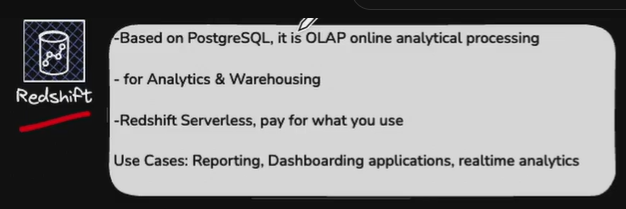

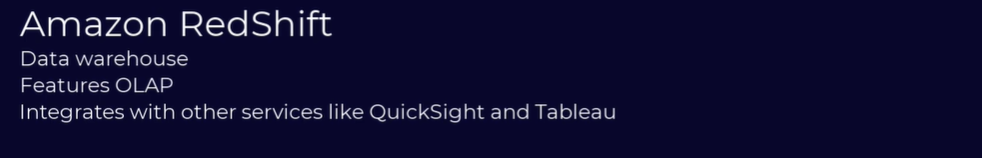


### Redshift Architecture

```text
Operational data sources
   ├── Amazon RDS
   ├── Amazon S3
   ├── Applications
   └── External databases
            ↓
      Amazon Redshift
            ↓
   SQL analytics and BI
            ↓
Quick Sight, Power BI or Tableau
```

### OLTP vs OLAP

| Feature | RDS | Redshift |
|---|---|---|
| Workload | OLTP | OLAP |
| Main purpose | Daily application transactions | Analytics and reporting |
| Queries | Small and frequent | Large and complex |
| Data volume | Operational data | Large historical datasets |
| Example | Creating an order | Analyzing five years of sales |

### Deployment Options

| Deployment | Description |
|---|---|
| Provisioned cluster | You select and manage cluster capacity |
| Redshift Serverless | AWS automatically provisions and scales capacity |

### Main Features

- Columnar data storage
- Massively parallel processing
- SQL support
- Data compression
- Redshift Spectrum for querying S3
- Integration with BI tools
- Automated backups
- Encryption
- Workload management
- Data sharing
- Materialized views

### Common Use Cases

Use Redshift for:

- Business intelligence
- Data warehousing
- Historical-data analysis
- Financial reporting
- Manufacturing analytics
- Customer analytics
- Large SQL aggregations
- Combining data from multiple systems

### Redshift vs RDS

| Feature | Redshift | RDS |
|---|---|---|
| Purpose | Analytics | Transactions |
| Storage format | Column-oriented | Usually row-oriented |
| Query type | Large analytical queries | Short operational queries |
| Typical users | Analysts and BI systems | Applications and customers |
| Example | Total sales by year | Insert a new customer order |

---

## 4.25 Amazon EMR

Amazon EMR was previously called Amazon Elastic MapReduce.

It is a managed big-data platform for running open-source frameworks such as:

- Apache Spark
- Apache Hadoop
- Apache Hive
- Apache HBase
- Apache Flink
- Presto or Trino

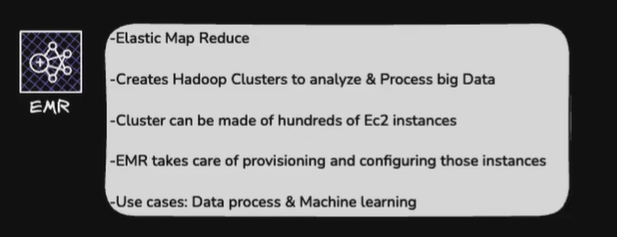




### EMR Processing Flow

```text
Large datasets in S3
          ↓
     Amazon EMR
          ↓
Spark, Hadoop or Hive processing
          ↓
Processed data
          ↓
S3, Redshift or another data store
```

### EMR Node Types

| Node | Purpose |
|---|---|
| Primary node | Manages the cluster and coordinates jobs |
| Core node | Processes data and can store data in HDFS |
| Task node | Provides additional processing capacity |

### EMR Deployment Options

| Option | Description |
|---|---|
| EMR on EC2 | Runs managed clusters on EC2 instances |
| EMR on EKS | Runs big-data workloads on Amazon EKS |
| EMR Serverless | Runs jobs without managing clusters |

### Main Features

- Managed Spark and Hadoop
- Parallel processing
- Automatic or manual scaling
- Integration with Amazon S3
- Spot Instance support
- Processing of very large datasets
- Support for notebooks
- Integration with AWS Glue Data Catalog

### Common Use Cases

Use EMR for:

- Big-data processing
- ETL pipelines
- Log analysis
- Machine-learning data preparation
- Genomic-data processing
- Clickstream analysis
- Large-scale Spark jobs
- Processing data lakes

### EMR vs Glue

| Feature | Amazon EMR | AWS Glue |
|---|---|---|
| Main purpose | Flexible big-data platform | Serverless data integration |
| Infrastructure | Cluster, EKS or serverless | Serverless |
| Control | High | More managed |
| Framework flexibility | Broad | Primarily managed ETL engines |
| Best use | Complex big-data workloads | ETL and data cataloging |

---

## 4.26 Amazon Athena

Amazon Athena is a serverless interactive query service that uses standard SQL to analyze data directly in Amazon S3.

Athena does not require loading the data into a traditional database.


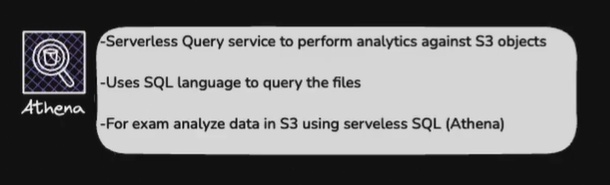




### Athena Architecture

```text
Files in Amazon S3
        ↓
AWS Glue Data Catalog
        ↓
Amazon Athena SQL query
        ↓
Query results stored in S3
```

### Supported Data Formats

Athena can query formats such as:

- CSV
- JSON
- Apache Parquet
- Apache ORC
- Apache Avro
- Apache Iceberg

Columnar formats such as Parquet and ORC normally provide better performance and lower query cost.

### Example Athena Query

```sql
SELECT
    production_line,
    SUM(packed_quantity) AS total_packed
FROM manufacturing_data
GROUP BY production_line;
```

### Main Features

- Serverless
- Standard SQL
- Direct queries against S3
- Automatic scaling
- Integration with Glue Data Catalog
- Federated queries
- Apache Spark support
- Pay-per-query model
- Integration with BI tools

### Athena Cost Optimization

Athena SQL costs are largely influenced by how much data a query scans.

Reduce scanned data by:

- Using Parquet or ORC
- Compressing files
- Partitioning data
- Selecting only required columns
- Avoiding `SELECT *`
- Filtering partitions

### Common Use Cases

Use Athena for:

- Ad-hoc SQL analysis
- S3 log analysis
- Querying data lakes
- CloudTrail analysis
- Application-log investigation
- Quick exploration of CSV and Parquet files
- Preparing datasets for dashboards

### Athena vs Redshift

| Feature | Athena | Redshift |
|---|---|---|
| Infrastructure | Serverless | Serverless or provisioned |
| Data location | Primarily S3 | Redshift-managed storage and external data |
| Best use | Ad-hoc queries | Repeated, complex analytics |
| Payment | Mainly data scanned | Compute capacity and storage |
| Data loading | Usually unnecessary | Data is commonly loaded or integrated |
| Performance tuning | File formats and partitions | Distribution, sort keys and workload design |

---

## 4.27 Amazon Quick Sight

> Amazon QuickSight has evolved into Amazon Quick. The business-intelligence functionality continues as Amazon Quick Sight.

Amazon Quick Sight is AWS’s managed business-intelligence and data-visualization capability.

It enables users to:

- Connect to data sources
- Prepare datasets
- Create analyses
- Build visualizations
- Publish dashboards
- Share reports
- Embed analytics into applications


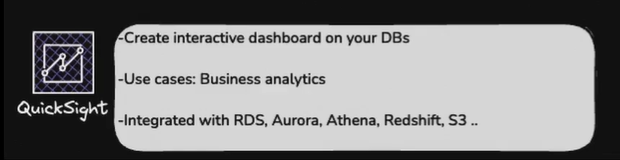


### Quick Sight Workflow

```text
Data sources
   ├── Amazon Redshift
   ├── Amazon Athena
   ├── Amazon RDS
   ├── Amazon S3
   └── External databases
            ↓
         Dataset
            ↓
         Analysis
            ↓
        Dashboard
            ↓
          Readers
```

### Main Components

| Component | Purpose |
|---|---|
| Data source | Connection to the original data |
| Dataset | Prepared data used for analysis |
| Analysis | Workspace for creating visuals |
| Dashboard | Published read-only version of an analysis |
| Report | Formatted or scheduled analytical output |
| SPICE | In-memory analytical engine |

### SPICE

SPICE means:

```text
Super-fast, Parallel, In-memory Calculation Engine
```

SPICE imports and stores data in memory to provide faster visual interactions.

Two connection modes are available:

| Mode | Description |
|---|---|
| SPICE | Imports data into the in-memory engine |
| Direct query | Queries the original data source directly |

### Main Features

- Interactive dashboards
- Charts, tables and KPIs
- Filters and parameters
- Drill-down functionality
- Scheduled dataset refresh
- Embedded analytics
- Row-level security
- Mobile access
- Paginated reports
- AI-assisted analytics
- Integration with AWS data services

### Common Use Cases

Use Quick Sight for:

- Executive dashboards
- Sales reporting
- Manufacturing dashboards
- Financial analysis
- Embedded customer analytics
- Operational monitoring
- Sharing reports across organizations

### Quick Sight vs Athena

| Feature | Quick Sight | Athena |
|---|---|---|
| Main purpose | Visualize and share data | Query data using SQL |
| Primary users | Business users and analysts | Analysts and data engineers |
| Output | Dashboards and reports | Query results |
| Relationship | Can use Athena as a data source | Can prepare data for Quick Sight |

---

## 4.28 AWS Glue

AWS Glue is a serverless data-integration service used to discover, prepare, clean, transform and move data.

It supports:

- ETL
- ELT
- Batch processing
- Streaming data integration
- Centralized metadata management

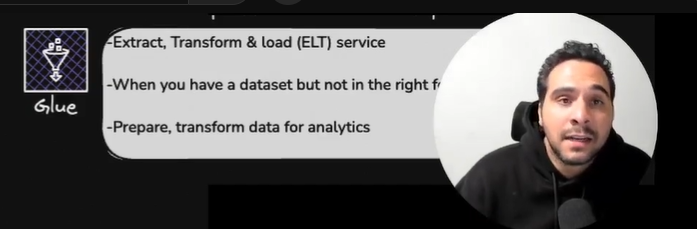


### ETL Meaning

```text
Extract → Transform → Load
```

- **Extract:** Read data from a source.
- **Transform:** Clean, join, filter or restructure the data.
- **Load:** Write the processed data to a target.

### Glue Architecture

```text
Raw data in S3, RDS or other sources
                 ↓
            Glue Crawler
                 ↓
          Glue Data Catalog
                 ↓
             Glue Job
                 ↓
     Cleaned and transformed data
                 ↓
      S3, Redshift or another target
```

### Main Glue Components

| Component | Purpose |
|---|---|
| Glue Data Catalog | Stores metadata about datasets |
| Crawler | Scans data and detects its schema |
| Classifier | Determines the format of data |
| Database | Logical container for catalog tables |
| Table | Metadata describing a dataset |
| Job | Executes ETL transformation logic |
| Trigger | Starts a job based on a schedule or event |
| Workflow | Coordinates multiple jobs, crawlers and triggers |
| Glue Studio | Visual interface for creating ETL jobs |

### Important Point About the Data Catalog

The Glue Data Catalog stores metadata, not normally the actual business data.

Metadata includes:

- Dataset location
- Column names
- Data types
- File format
- Partitions
- Table properties

The actual data can remain in Amazon S3, RDS, Redshift or another source.

### Example Glue Workflow

```text
CSV files uploaded to S3
          ↓
Glue Crawler detects schema
          ↓
Schema stored in Glue Data Catalog
          ↓
Glue ETL job cleans the data
          ↓
Output saved as Parquet in S3
          ↓
Athena queries the processed data
          ↓
Quick Sight creates dashboards
```

### Main Features

- Serverless ETL
- Automatic schema discovery
- Central metadata catalog
- Visual ETL development
- Apache Spark-based transformations
- Job scheduling
- Workflow orchestration
- Batch and streaming processing
- Integration with S3, Athena, EMR and Redshift
- Data-quality capabilities

### Common Use Cases

Use AWS Glue for:

- Building data pipelines
- Cleaning raw data
- Converting CSV to Parquet
- Cataloging an S3 data lake
- Moving data between systems
- Preparing data for Athena
- Loading data into Redshift
- Joining data from multiple sources
- Batch or streaming ETL

### Glue vs DMS

| Feature | AWS Glue | AWS DMS |
|---|---|---|
| Main purpose | Data integration and transformation | Database migration and replication |
| Transformation | Strong ETL capabilities | Limited transformations |
| Ongoing replication | Streaming is possible but not its main role | Change Data Capture |
| Schema discovery | Glue Crawlers | Endpoint and schema assessment tools |
| Typical use | Build analytical data pipelines | Move databases with low downtime |

### Glue, Athena and Quick Sight Together

```text
Amazon S3
    ↓
Glue Crawler
    ↓
Glue Data Catalog
    ↓
Amazon Athena
    ↓
Amazon Quick Sight
```

- **S3:** Stores the data.
- **Glue:** Discovers and catalogs the data.
- **Athena:** Queries the data using SQL.
- **Quick Sight:** Visualizes the results.


---

## 4.29 Amazon Kinesis

Amazon Kinesis is a collection of AWS services for collecting, processing and analyzing real-time streaming data.

Streaming data is continuously generated instead of arriving as one complete file.

Examples include:

- Application logs
- Website clickstreams
- IoT sensor readings
- Financial transactions
- Manufacturing-machine data
- Video streams
- Real-time location data


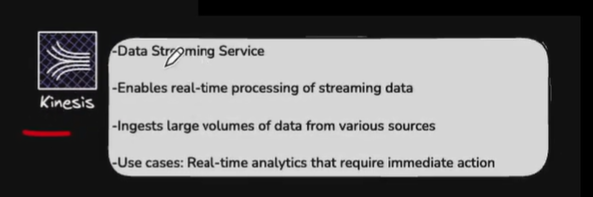


### Batch vs Streaming Processing

| Feature | Batch processing | Stream processing |
|---|---|---|
| Data processing | Processes collected data periodically | Processes data continuously |
| Latency | Minutes or hours | Seconds or milliseconds |
| Example | Daily sales report | Real-time fraud detection |
| AWS services | Glue, EMR | Kinesis Data Streams, Flink |

### Basic Streaming Architecture

```text
Data producers
     ↓
Kinesis Data Streams
     ↓
Stream consumers
     ↓
Processing and storage
```

Example:

```text
Factory machines
      ↓
Kinesis Data Streams
      ↓
Lambda or Apache Flink
      ↓
S3, DynamoDB, OpenSearch or dashboards
```


### Kinesis-Related Services

| Service | Purpose |
|---|---|
| Kinesis Data Streams | Collects and stores real-time data streams |
| Amazon Data Firehose | Delivers streaming data to destinations |
| Kinesis Video Streams | Captures and processes video streams |
| Managed Service for Apache Flink | Processes and analyzes streaming data |


### Amazon Kinesis Data Streams

Kinesis Data Streams collects and temporarily stores real-time streaming records.

Applications can write data to the stream, and one or more consumers can read and process it.

```text
Producers
    ↓
Kinesis Data Stream
    ↓
Consumers
```

#### Producers

Producers send records into the stream.

Examples include:

- Web applications
- Mobile applications
- IoT devices
- EC2 applications
- Log agents
- Manufacturing machines

#### Consumers

Consumers read and process records from the stream.

Examples include:

- AWS Lambda
- Amazon Data Firehose
- Managed Service for Apache Flink
- EC2 applications
- Amazon EMR
- Custom applications

#### Records

A record contains:

- Partition key
- Sequence number
- Data blob

```json
{
  "MachineID": "Machine-21",
  "Temperature": 850,
  "Timestamp": "2026-09-08T14:30:00Z"
}
```

#### Partition Key

The partition key determines which shard receives the record.

Records with the same partition key are normally sent to the same shard.

```text
Partition key: Machine-21
                 ↓
               Shard 1
```

#### Shards

A stream is divided into shards.

```text
Kinesis stream
   ├── Shard 1
   ├── Shard 2
   └── Shard 3
```

More shards generally provide greater read and write capacity.

#### Capacity Modes

| Mode | Description |
|---|---|
| On-demand | AWS automatically manages stream capacity |
| Provisioned | You configure and manage the number of shards |

#### Data Retention

Records remain in the stream for a configured retention period, allowing consumers to process or reprocess them.

Kinesis Data Streams has a minimum retention period of 24 hours.

#### Enhanced Fan-Out

Enhanced fan-out gives registered consumers dedicated read throughput from each shard.

It is useful when several consumers need to process the same stream independently.

```text
                   ┌── Lambda consumer
Kinesis stream ────┼── Analytics consumer
                   └── Monitoring consumer
```


### Amazon Data Firehose

Amazon Data Firehose is a fully managed service that delivers streaming data to configured destinations.

Common destinations include:

- Amazon S3
- Amazon Redshift
- Amazon OpenSearch Service
- Splunk
- Apache Iceberg tables
- Supported HTTP endpoints

```text
Data producers
      ↓
Amazon Data Firehose
      ↓
S3, Redshift, OpenSearch or another destination
```

Firehose can:

- Buffer records
- Compress data
- Encrypt data
- Transform records using Lambda
- Convert record formats
- Back up failed records to S3
- Automatically scale delivery capacity

#### Important Point

Firehose normally buffers data until it reaches a configured:

- Buffer size, or
- Buffer interval

It then delivers the batch to the destination.

Therefore, Firehose delivery is usually near-real-time rather than immediate record-by-record processing.


### Kinesis Data Streams vs Amazon Data Firehose

| Feature | Kinesis Data Streams | Amazon Data Firehose |
|---|---|---|
| Purpose | Build custom streaming applications | Deliver data to destinations |
| Data processing | Consumers process individual records | Managed buffering and delivery |
| Consumers | Multiple custom consumers | Configured destination |
| Scaling | On-demand or shard management | Automatically managed |
| Data retention | Configurable | Temporary delivery buffering |
| Replay | Supported during retention | Not designed as a replayable stream |
| Management | More application control | More fully managed |
| Best use | Real-time processing | Loading streaming data into S3 or analytics services |


### Kinesis Video Streams

Kinesis Video Streams securely captures, processes and stores video streams.

Sources can include:

- Security cameras
- Smartphones
- Drones
- Industrial cameras
- Robots
- Smart-home devices

Common use cases include:

- Video analytics
- Computer vision
- Security monitoring
- Machine-learning video processing
- Live video applications


### Amazon Managed Service for Apache Flink

Amazon Managed Service for Apache Flink processes and analyzes streaming data using Apache Flink.

It supports application development with:

- Java
- Scala
- Python
- SQL

```text
Kinesis Data Streams
         ↓
Managed Service for Apache Flink
         ↓
Filter, aggregate, join or analyze
         ↓
S3, OpenSearch, database or dashboard
```

Common operations include:

- Windowed aggregations
- Stream joins
- Filtering
- Anomaly detection
- Real-time metrics
- Time-series analysis
- Stateful stream processing


### Practical Manufacturing Example

Assume factory machines continuously send:

- Temperature
- Production speed
- Defect count
- Downtime status

The architecture could be:

```text
Factory machines
       ↓
Kinesis Data Streams
       ↓
Managed Service for Apache Flink
       ↓
Detect high temperature or abnormal losses
       ↓
Amazon Data Firehose
       ↓
Amazon S3
       ↓
Athena and Quick Sight
```

This architecture supports:

- Immediate alerts
- Real-time monitoring
- Historical data storage
- SQL analysis
- BI dashboards


### Kinesis vs SQS

| Feature | Kinesis Data Streams | Amazon SQS |
|---|---|---|
| Main purpose | Streaming data | Message queuing |
| Consumers | Multiple consumers can process the same record | A message is normally processed by one consumer |
| Replay | Supported during retention | Not normally used for replay |
| Ordering | Maintained within a shard | FIFO queues support strict ordering |
| Scaling unit | Shards or on-demand mode | Automatically managed |
| Common use | Analytics and event streams | Decoupling application components |

### When to Use Kinesis

Use Kinesis when you need:

- Continuous real-time data ingestion
- Multiple consumers for the same records
- Stream replay
- Real-time analytics
- High-volume event processing
- IoT or sensor-data ingestion
- Log and clickstream processing

Use SQS when you primarily need reliable message delivery between application components.

---

## 4.30 Amazon QLDB

> **Service status:** Amazon Quantum Ledger Database reached end of support and full shutdown on July 31, 2025. It should not be used for new architectures.

Amazon Quantum Ledger Database—Amazon QLDB—was a fully managed ledger database that maintained a complete and cryptographically verifiable history of data changes.

QLDB was designed to provide an authoritative system of record.


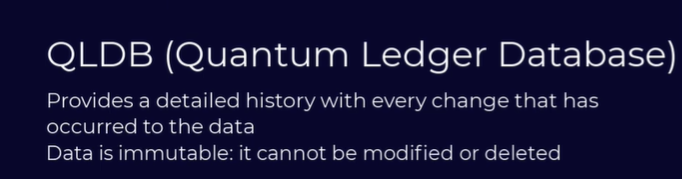


### Ledger Database Meaning

A ledger database records:

- The current value of data
- Every previous version
- Who or what changed the data
- When the change occurred
- The complete sequence of changes

```text
Original record
      ↓
First modification
      ↓
Second modification
      ↓
Current record
```

The historical journal was append-only, so committed history could not be silently modified or deleted.

### QLDB Architecture

```text
Application
     ↓
QLDB tables
     ↓
Current data
     +
Immutable journal
     ↓
Complete data history
```

### Main QLDB Concepts

| Concept | Description |
|---|---|
| Ledger | The complete QLDB database |
| Table | Stores application documents |
| Document | A record stored in a table |
| Journal | Immutable sequence of committed changes |
| Revision | A specific version of a document |
| Digest | Cryptographic hash representing the journal |
| PartiQL | SQL-compatible query language used with QLDB |

### Example Record History

Assume an account balance changes:

```text
Initial balance: 1,000
Deposit: +500
Withdrawal: -200
Current balance: 1,300
```

A normal database might store only:

```json
{
  "AccountID": "A001",
  "Balance": 1300
}
```

QLDB stored the current record and its complete change history.

### Cryptographic Verification

QLDB generated cryptographic digests that could verify whether the journal history had been altered.

```text
Journal records
      ↓
Cryptographic hashing
      ↓
Digest
      ↓
Integrity verification
```

This provided tamper-evident verification, but QLDB was not a blockchain.

### QLDB vs Blockchain

| Feature | QLDB | Blockchain |
|---|---|---|
| Management | Centralized and managed by AWS | Usually distributed |
| Authority | One trusted owner | Multiple participants |
| Consensus mechanism | Not required | Normally required |
| History | Immutable and verifiable | Immutable and distributed |
| Performance | Higher centralized performance | Depends on blockchain network |

### Historical Use Cases

QLDB was used for:

- Financial transaction history
- Supply-chain records
- Vehicle ownership history
- Insurance claims
- Healthcare records
- Regulatory audit trails
- Employee or customer record changes

### QLDB Replacement

AWS recommended migrating QLDB workloads to Amazon Aurora PostgreSQL.

A replacement architecture may use:

```text
Amazon Aurora PostgreSQL
        +
History or audit tables
        +
Database triggers
        +
Application-level audit logic
        +
AWS CloudTrail where applicable
```

The exact replacement depends on whether the application requires:

- Immutable history
- Cryptographic verification
- Relational queries
- Event sourcing
- Audit logging
- Blockchain decentralization

### Important Exam Point

QLDB may appear in older AWS courses or exam materials as:

```text
A managed ledger database with an immutable and cryptographically verifiable transaction log
```

However, for current AWS architecture:

```text
Amazon QLDB = Retired service
Do not use for new workloads
```

---


## 4.31 Amazon Managed Blockchain

Amazon Managed Blockchain—AMB—is a fully managed AWS service for building applications that interact with public and private blockchain networks.

It removes much of the operational work required to:

- Provision blockchain nodes
- Maintain blockchain infrastructure
- Synchronize nodes
- Scale blockchain access
- Retrieve blockchain data
- Manage private blockchain networks


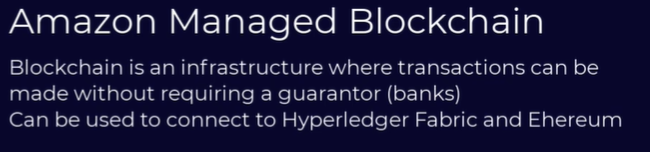

### What Is a Blockchain?

A blockchain is a distributed ledger in which transactions are grouped into blocks and cryptographically connected.

```text
Block 1
   ↓
Block 2
   ↓
Block 3
   ↓
Block 4
```

Each block normally contains:

- Transaction data
- Timestamp
- Cryptographic hash
- Hash of the previous block

Changing an earlier block breaks the cryptographic chain, making unauthorized modification detectable.

### Blockchain Characteristics

- Distributed records
- Cryptographic verification
- Shared transaction history
- Tamper-evident data
- Consensus between network participants
- Public or permissioned participation
- Smart-contract support on some networks


### Public vs Private Blockchain

| Feature | Public blockchain | Private blockchain |
|---|---|---|
| Access | Open to the public | Restricted to approved organizations |
| Participants | Usually unknown | Known and authorized |
| Control | Decentralized | Controlled by members |
| Examples | Bitcoin, Ethereum and Polygon | Hyperledger Fabric |
| Common use | Cryptocurrency and Web3 | Business collaboration |


### Amazon Managed Blockchain Components

Amazon Managed Blockchain has two major capabilities:

| Component | Purpose |
|---|---|
| AMB Access | Connects applications to supported public or private blockchain networks |
| AMB Query | Retrieves standardized current and historical blockchain data |


### AMB Access

AMB Access provides managed infrastructure for interacting with supported blockchain networks.

It can provide:

- Serverless blockchain API access
- Dedicated blockchain nodes
- Managed private blockchain networks
- JSON-RPC endpoints
- AWS IAM authorization
- Monitoring and managed infrastructure

Supported capabilities include access to networks such as:

- Ethereum
- Bitcoin
- Polygon
- Hyperledger Fabric private networks

Availability depends on the selected network, AWS Region and access method.

### Public Blockchain Access Example

```text
Web3 application
        ↓
AMB Access endpoint
        ↓
Ethereum, Bitcoin or Polygon
        ↓
Read blockchain data or submit transactions
```

AMB Access allows developers to interact with blockchain networks without operating and synchronizing their own blockchain nodes.


### AMB Query

AMB Query provides API operations for retrieving standardized public-blockchain information.

It can retrieve information such as:

- Current token balances
- Historical token balances
- Wallet transaction history
- Transaction details
- Transaction events
- Token contracts
- Native cryptocurrency balances
- Fungible-token information
- NFT information

```text
Application
     ↓
AMB Query API
     ↓
Standardized blockchain data
     ↓
Application logic or analytics
```

AMB Query can remove the need to:

- Operate blockchain nodes
- Parse raw blockchain blocks
- Build custom blockchain indexers
- Maintain blockchain ETL pipelines


### Hyperledger Fabric on AMB

Hyperledger Fabric is designed for private, permissioned blockchain networks.

A private network can contain multiple organizations.

```text
Organization A
      │
Organization B ─── Shared blockchain network
      │
Organization C
```

Each organization can have:

- Network membership
- Peer nodes
- Certificates
- Access permissions
- Chaincode
- Shared ledger data

### Chaincode

Chaincode is the business logic executed on a Hyperledger Fabric network.

It is similar to a smart contract.

Example business rules might include:

- Transfer asset ownership
- Approve a shipment
- Verify a supplier
- Record a transaction
- Update an order status


### Common Use Cases

Use Amazon Managed Blockchain for:

- Web3 applications
- Cryptocurrency wallets
- Blockchain analytics
- Token-balance applications
- NFT applications
- Supply-chain collaboration
- Trade-finance networks
- Digital-asset applications
- Private multi-organization ledgers
- Blockchain transaction monitoring


### Example: Supply-Chain Blockchain

```text
Raw-material supplier
        ↓
Manufacturer
        ↓
Shipping company
        ↓
Distributor
        ↓
Customer
```

Each approved participant records updates in a shared blockchain network.

Example events:

```text
Material produced
Material inspected
Product manufactured
Shipment dispatched
Shipment delivered
```

Authorized organizations can verify the shared transaction history.


### AMB vs QLDB

| Feature | Amazon Managed Blockchain | Amazon QLDB |
|---|---|---|
| Service status | Available | Retired |
| Architecture | Distributed blockchain networks | Centralized ledger database |
| Participants | Public or multiple organizations | One central owner |
| Consensus | Provided by the blockchain network | Not required |
| Frameworks/networks | Ethereum, Bitcoin, Polygon and Hyperledger Fabric | AWS proprietary ledger |
| Main use | Web3 and multi-party blockchain applications | Historical ledger applications |
| New workloads | Can be used | Must not be used |

### Important Difference

```text
QLDB:
One organization controls a verifiable ledger.

Managed Blockchain:
Applications interact with distributed public or private blockchain networks.
```


### AMB vs Traditional Database

| Feature | Managed Blockchain | Traditional database |
|---|---|---|
| Control | Distributed or shared | Centralized |
| Data modification | Blockchain rules apply | Records can normally be updated |
| Consensus | Required by the blockchain | Not normally required |
| Performance | Usually lower | Usually higher |
| Complexity | Higher | Lower |
| Best use | Multiple parties requiring shared trust | Normal business applications |

### When Not to Use Blockchain

Do not use Managed Blockchain merely because an application needs:

- A relational database
- An audit log
- Data encryption
- Ordinary transaction history
- Fast database queries
- One trusted organizational owner

A traditional database with auditing is usually simpler and less expensive for these requirements.

Use blockchain when multiple participants need to share data and cannot rely completely on one central party.


### Security

Amazon Managed Blockchain security can involve:

- AWS IAM permissions
- Private keys
- Public keys
- Wallet signatures
- VPC endpoints
- Security groups
- TLS encryption
- Framework-level identities and permissions

### Important Private-Key Rule

AWS IAM permissions and blockchain-wallet private keys are different.

```text
IAM permissions:
Control access to AWS and AMB APIs.

Blockchain private key:
Signs blockchain transactions.
```

Never store blockchain private keys in:

- Source code
- Public GitHub repositories
- EC2 user data
- Unencrypted files

Use an appropriate secure key-management approach.


### Key Exam Points

- The correct service name is Amazon Managed Blockchain.
- AMB supports public and private blockchain use cases.
- AMB Access connects applications to blockchain networks.
- AMB Query retrieves standardized blockchain data.
- Hyperledger Fabric supports private permissioned networks.
- Ethereum, Bitcoin and Polygon are public blockchain networks.
- Blockchain private keys are different from AWS IAM credentials.
- Managed Blockchain does not replace a normal database for ordinary applications.
- QLDB was centralized; Managed Blockchain supports distributed networks.



---


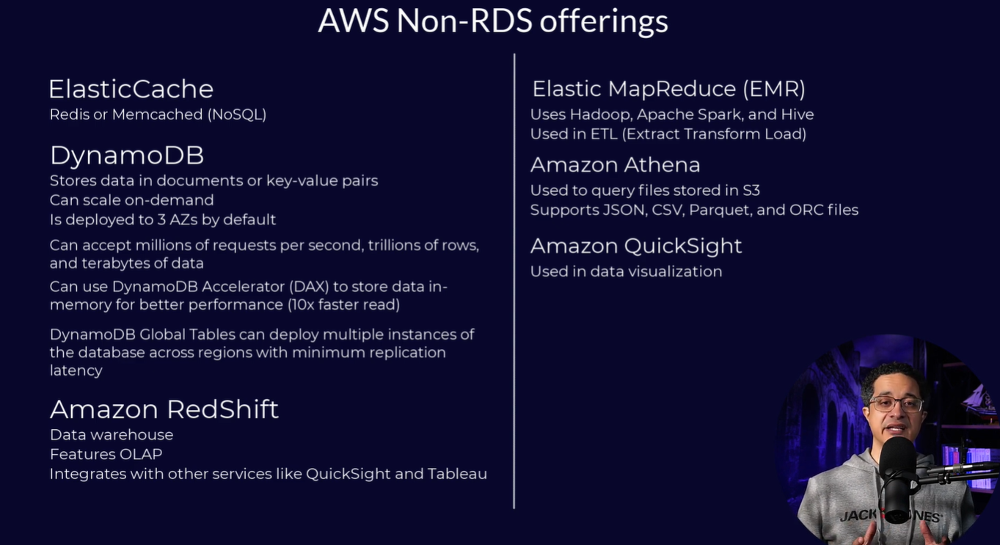


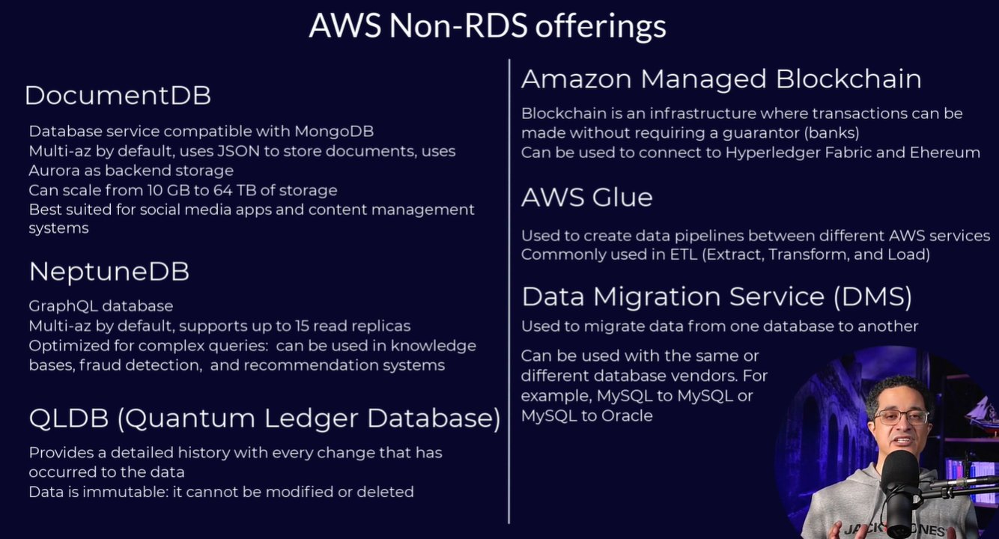

---

## Official AWS References

- [What is Amazon RDS?](https://docs.aws.amazon.com/AmazonRDS/latest/UserGuide/Welcome.html)
- [Setting up public or private access in Amazon RDS](https://docs.aws.amazon.com/AmazonRDS/latest/gettingstartedguide/security-public-private.html)
- [Security best practices for Amazon RDS](https://docs.aws.amazon.com/AmazonRDS/latest/UserGuide/CHAP_BestPractices.Security.html)
- [Automatically connecting EC2 and RDS](https://docs.aws.amazon.com/AmazonRDS/latest/UserGuide/ec2-rds-connect.html)
- [Working with RDS read replicas](https://docs.aws.amazon.com/AmazonRDS/latest/UserGuide/USER_ReadRepl.html)
- [Resilience in Amazon RDS](https://docs.aws.amazon.com/AmazonRDS/latest/UserGuide/disaster-recovery-resiliency.html)
- [RDS billing](https://docs.aws.amazon.com/AmazonRDS/latest/UserGuide/User_DBInstanceBilling.html)


## **Practical**

### Amazon RDS Practical Case Study

### 1. Case Study Overview

Assume we are building an online store called:

```text
ABC Online Store
```

The application needs to store:

* Customers
* Products
* Orders

We will use:

| Component               | AWS Service     |
| ----------------------- | --------------- |
| Application Server      | Amazon EC2      |
| Database                | Amazon RDS      |
| Database Engine         | MySQL           |
| Network                 | Amazon VPC      |
| MySQL Port              | 3306            |
| EC2 Security Group      | `web-server-sg` |
| RDS Security Group      | `rds-mysql-sg`  |
| Database Name           | `shopdb`        |
| RDS Instance Identifier | `shop-db`       |

---

### 2. Architecture

```text
                     Internet
                        │
                        ▼
                 Internet Gateway
                        │
                        ▼
                Public Subnet
                        │
                 ┌─────────────┐
                 │     EC2     │
                 │ Web / API   │
                 └──────┬──────┘
                        │
                        │ MySQL TCP 3306
                        ▼
                 Private Subnet
                 ┌─────────────┐
                 │ Amazon RDS  │
                 │    MySQL    │
                 │             │
                 │ Customers   │
                 │ Products    │
                 │ Orders      │
                 └─────────────┘
```

The important idea is:

```text
Users
  │
  ▼
EC2 Application
  │
  ▼
RDS Database
```

Users should **not connect directly to RDS**.

---

### 3. Create EC2 Security Group

Assume our EC2 instance uses the following security group:

```text
web-server-sg
```

Example inbound rules:

| Type  | Port | Source      |
| ----- | ---: | ----------- |
| HTTP  |   80 | `0.0.0.0/0` |
| HTTPS |  443 | `0.0.0.0/0` |
| SSH   |   22 | Your IP     |

Example:

```text
HTTP      TCP 80      0.0.0.0/0
HTTPS     TCP 443     0.0.0.0/0
SSH       TCP 22      YOUR-IP
```

We do **not** expose MySQL port `3306` to the Internet.

---

### 4. Open Amazon RDS

From AWS Console:

```text
AWS Console
    ↓
RDS
    ↓
Databases
    ↓
Create database
```

Choose:

```text
Standard Create
```

Standard Create is useful for learning because it exposes networking, storage, security, backup, availability, and authentication settings.


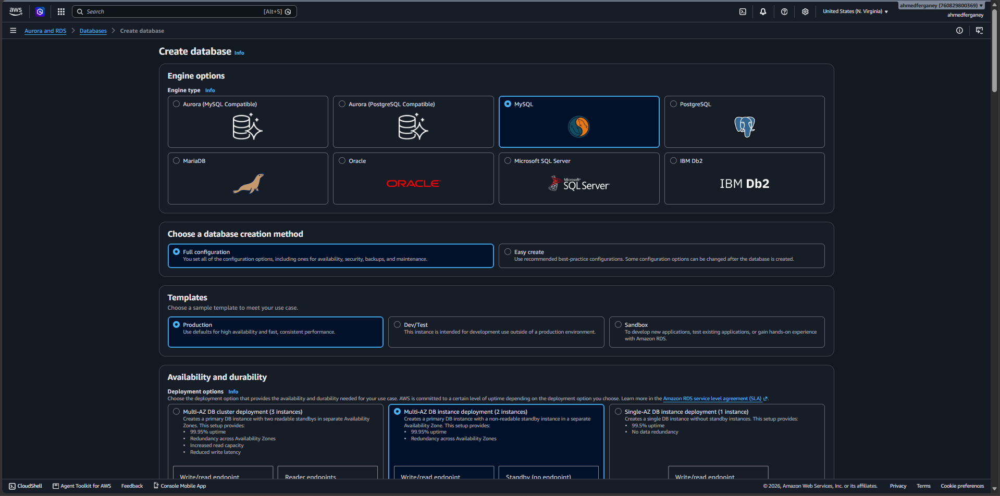

---

### 5. Select Database Engine

Choose:

```text
Engine Type:
MySQL
```

Select a supported MySQL version.

The architecture becomes:

```text
EC2 Application
       │
       │ SQL Queries
       │
       ▼
Amazon RDS MySQL
```

---

### 6. Select Database Template

For learning or testing choose:

```text
Dev/Test
```

For a production environment, additional options should be considered:

```text
Multi-AZ
Larger DB Instance
Automated Backups
Monitoring
Performance Insights
Storage Autoscaling
Encryption
Secrets Manager
```

---

### 7. Configure Database Settings

Example configuration:

```text
DB Instance Identifier:
shop-db

Master Username:
admin
```

Set a strong password.

Example:

```text
Master Username: admin

Master Password:
***************
```

Do not store the database password directly inside application source code.

In production, credentials can be stored using:

```text
AWS Secrets Manager
```

---

### 8. Select DB Instance Class

For a learning environment choose a small burstable instance supported by your AWS account.

Example:

```text
db.t4g.micro
```

The DB instance class determines resources such as:

```text
CPU
RAM
Network Performance
```

Conceptually:

```text
DB Instance Class
       │
       ├── CPU
       ├── Memory
       └── Networking
```

---

### 9. Configure Storage

Example:

```text
Storage Type:
General Purpose SSD

Allocated Storage:
20 GiB
```

You may also enable:

```text
Storage Autoscaling
```

Example:

```text
Initial Storage: 20 GB

Maximum Storage: 100 GB
```

This allows RDS to increase storage when additional space is required.

---

### 10. Configure Connectivity

Select the same VPC used by the EC2 instance.

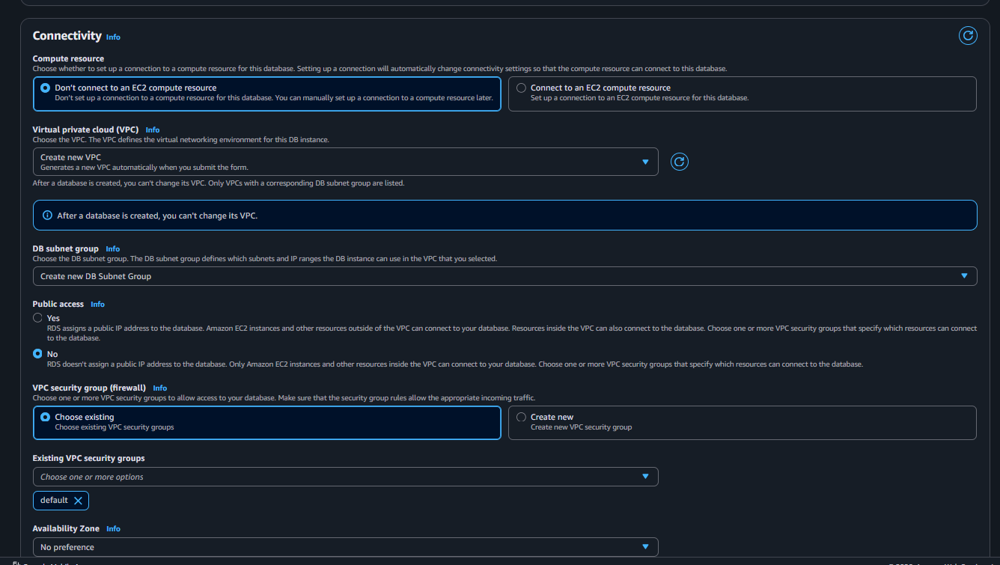

Example:

```text
VPC:
MyApplicationVPC
```

EC2 and RDS should communicate privately through the VPC.

Set:

```text
Public Access:

No
```

This prevents direct Internet access to the database.

Incorrect architecture:

```text
Internet
   │
   ▼
RDS
```

Preferred architecture:

```text
Internet
   │
   ▼
EC2
   │
   ▼
RDS
```

---

### 11. Create RDS Security Group

Create a security group:

```text
rds-mysql-sg
```

Add the following inbound rule:

| Type         | Protocol | Port | Source          |
| ------------ | -------- | ---: | --------------- |
| MySQL/Aurora | TCP      | 3306 | `web-server-sg` |

The important part is:

```text
Source = web-server-sg
```

Do not use:

```text
MySQL
TCP
3306
0.0.0.0/0
```

Instead use:

```text
MySQL
TCP
3306
web-server-sg
```

This produces:

```text
Internet User
      │
      X
      │
      ▼
     RDS


EC2
web-server-sg
      │
      │ TCP 3306
      ▼
     RDS
```

Only resources associated with the application's security group can connect to MySQL.

---

### 12. Create the RDS Database

Review the configuration and click:

```text
Create Database
```

Initially the status will be:

```text
Creating
```

After creation finishes:

```text
Available
```

The database can now accept connections.


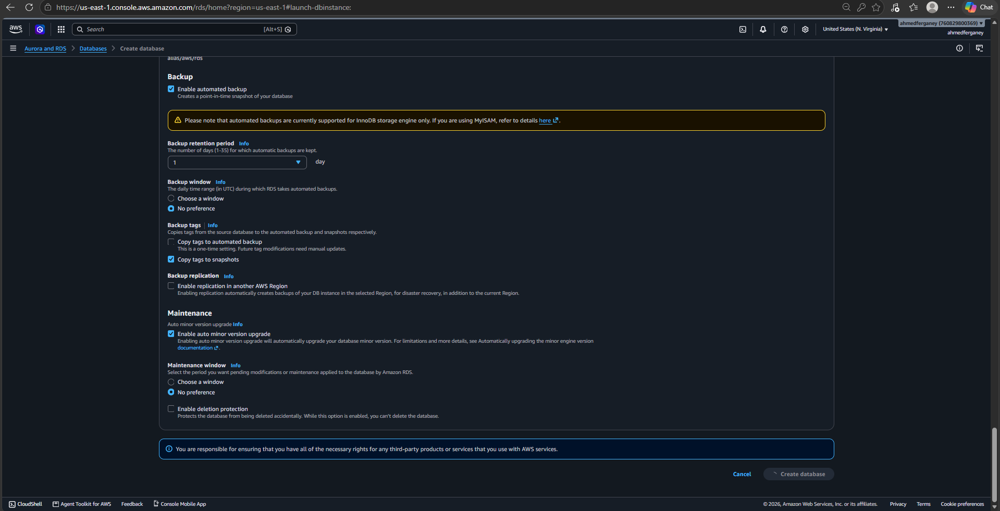

---

### 13. Get the RDS Endpoint

Go to:

```text
RDS
 ↓
Databases
 ↓
shop-db
 ↓
Connectivity & Security
```

You will find an endpoint similar to:

```text
shop-db.xxxxxxxxxxxx.us-east-1.rds.amazonaws.com
```

You will also see:

```text
Port: 3306
```

The endpoint is effectively the DNS address of the RDS database.

Instead of connecting using an IP address:

```text
192.168.10.20
```

the application connects using:

```text
shop-db.xxxxxxxxxxxx.us-east-1.rds.amazonaws.com
```

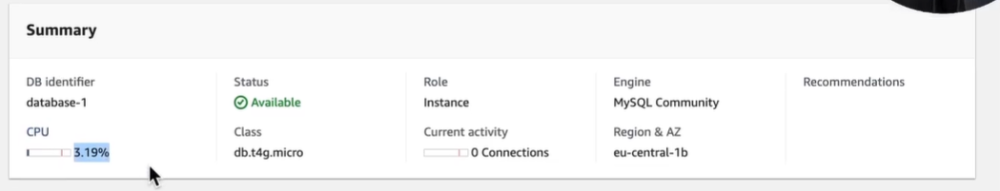

---

### 14. Connect to EC2

Connect to the EC2 instance using:

* EC2 Instance Connect
* SSH
* AWS Systems Manager if configured

Example terminal:

```bash
[ec2-user@ip-10-0-8-0 ~]$
```

---

### 15. Install MySQL Client on Amazon Linux 2023

Install the MariaDB/MySQL-compatible client:

```bash
sudo dnf install mariadb105 -y
```

Check the installation:

```bash
mysql --version
```

---

### 16. Connect From EC2 to RDS

Use the RDS endpoint.

```bash
mysql -h shop-db.xxxxxxxxxxxx.us-east-1.rds.amazonaws.com \
-P 3306 \
-u admin \
-p
```

You will then be asked for the password.

If the connection succeeds:

```text
MySQL [(none)]>
```

The connection flow is:

```text
EC2
 │
 │ TCP 3306
 │
 ▼
Amazon RDS MySQL
```

---

### 17. Create Application Database

Create the database:

```sql
CREATE DATABASE shopdb;
```

Select it:

```sql
USE shopdb;
```

Check available databases:

```sql
SHOW DATABASES;
```

You should see:

```text
shopdb
```

---

### 18. Create Customers Table

```sql
CREATE TABLE customers (
    customer_id INT AUTO_INCREMENT PRIMARY KEY,
    name VARCHAR(100) NOT NULL,
    email VARCHAR(150) UNIQUE NOT NULL,
    created_at TIMESTAMP DEFAULT CURRENT_TIMESTAMP
);
```

Check the table:

```sql
DESCRIBE customers;
```

---

### 19. Create Products Table

```sql
CREATE TABLE products (
    product_id INT AUTO_INCREMENT PRIMARY KEY,
    product_name VARCHAR(150) NOT NULL,
    price DECIMAL(10,2) NOT NULL,
    stock INT DEFAULT 0
);
```

Check:

```sql
DESCRIBE products;
```

---

### 20. Create Orders Table

```sql
CREATE TABLE orders (
    order_id INT AUTO_INCREMENT PRIMARY KEY,
    customer_id INT NOT NULL,
    order_date TIMESTAMP DEFAULT CURRENT_TIMESTAMP,
    total_amount DECIMAL(10,2),

    FOREIGN KEY (customer_id)
        REFERENCES customers(customer_id)
);
```

Database structure:

```text
shopdb
│
├── customers
│   ├── customer_id
│   ├── name
│   ├── email
│   └── created_at
│
├── products
│   ├── product_id
│   ├── product_name
│   ├── price
│   └── stock
│
└── orders
    ├── order_id
    ├── customer_id
    ├── order_date
    └── total_amount
```

---

### 21. Insert Test Customers

```sql
INSERT INTO customers (name, email)
VALUES
('Ahmed', 'ahmed@example.com'),
('Mohamed', 'mohamed@example.com');
```

Check:

```sql
SELECT * FROM customers;
```

---

### 22. Insert Test Products

```sql
INSERT INTO products (
    product_name,
    price,
    stock
)
VALUES
('Laptop', 1200.00, 10),
('Keyboard', 50.00, 100),
('Mouse', 25.00, 200);
```

Check:

```sql
SELECT * FROM products;
```

---

### 23. Insert an Order

Suppose Ahmed has:

```text
customer_id = 1
```

Create an order:

```sql
INSERT INTO orders (
    customer_id,
    total_amount
)
VALUES (
    1,
    1250.00
);
```

Check:

```sql
SELECT * FROM orders;
```

---

### 24. Query Customers

```sql
SELECT * FROM customers;
```

Example result:

```text
+-------------+----------+---------------------+
| customer_id | name     | email               |
+-------------+----------+---------------------+
| 1           | Ahmed    | ahmed@example.com   |
| 2           | Mohamed  | mohamed@example.com |
+-------------+----------+---------------------+
```

---

### 25. Query Orders With Customer Names

```sql
SELECT
    o.order_id,
    c.name,
    o.total_amount,
    o.order_date
FROM orders o
JOIN customers c
    ON o.customer_id = c.customer_id;
```

Example result:

```text
+----------+-------+--------------+
| order_id | name  | total_amount |
+----------+-------+--------------+
| 1        | Ahmed | 1250.00      |
+----------+-------+--------------+
```

---

### 26. Application Connection Example

Suppose later we deploy a Python FastAPI application on EC2.

The application configuration might contain:

```python
DB_HOST = "shop-db.xxxxxxxxxxxx.us-east-1.rds.amazonaws.com"
DB_PORT = 3306
DB_NAME = "shopdb"
DB_USER = "app_user"
```

The complete flow becomes:

```text
Customer
    │
    │ HTTPS
    ▼
FastAPI Application
on EC2
    │
    │ SQL
    │ TCP 3306
    ▼
Amazon RDS MySQL
    │
    ├── customers
    ├── products
    └── orders
```

The browser or frontend application should never connect directly to RDS.

---

### 27. Better Production Practice: Create an Application User

The master RDS account should not normally be used by the application.

Instead create a dedicated user.

Example:

```sql
CREATE USER 'shop_app'@'%' IDENTIFIED BY 'StrongPasswordHere';
```

Give it access only to the required database:

```sql
GRANT SELECT, INSERT, UPDATE, DELETE
ON shopdb.*
TO 'shop_app'@'%';
```

Apply privileges:

```sql
FLUSH PRIVILEGES;
```

Now the application can use:

```text
Username:
shop_app
```

instead of:

```text
admin
```

This follows the principle of:

```text
Least Privilege
```

---

### 28. Test the Application Database User

From EC2:

```bash
mysql \
-h shop-db.xxxxxxxxxxxx.us-east-1.rds.amazonaws.com \
-P 3306 \
-u shop_app \
-p \
shopdb
```

Test:

```sql
SELECT * FROM customers;
```

If successful, the application user is working correctly.

---

### 29. Why Use RDS Instead of Installing MySQL on EC2?

If we install MySQL directly on EC2:

```text
EC2
 │
 ├── Application
 └── MySQL
```

we are responsible for more database administration, including:

```text
Operating system maintenance
MySQL installation
Database patching
Backup configuration
Recovery
Storage management
Database monitoring
Replication
High availability configuration
```

With Amazon RDS:

```text
EC2
 │
 └── Application
        │
        ▼
      RDS
```

AWS handles much of the underlying database infrastructure.

We mainly manage:

```text
Database design
Tables
Queries
Indexes
Users
Permissions
Application integration
Performance tuning
```

---

### 30. RDS Automated Backups

For production workloads enable automated backups.

Example:

```text
Backup Retention Period:
7 days
```

RDS can automatically create backups and transaction logs.

This enables:

```text
Point-in-Time Recovery
```

Conceptually:

```text
RDS
 │
 ├── Automatic Backups
 │
 └── Transaction Logs
          │
          ▼
Point-in-Time Recovery
```

---

### 31. RDS Snapshots

A snapshot is a manual database backup.


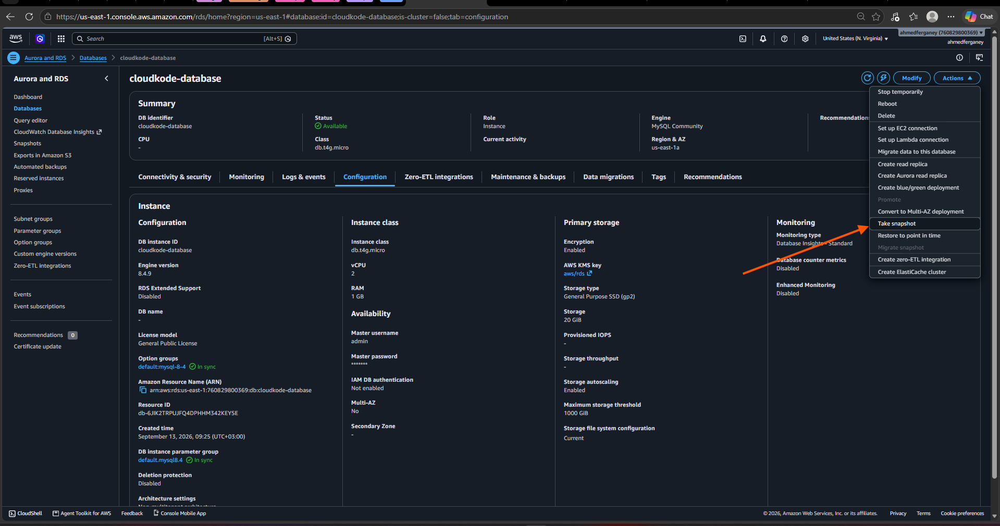

Example:

```text
RDS
 ↓
Databases
 ↓
shop-db
 ↓
Actions
 ↓
Take Snapshot
```

Example snapshot name:

```text
shop-db-before-upgrade
```

Snapshots are useful before:

```text
Application upgrades
Database migrations
Major schema changes
Testing
```

---

### 32. Multi-AZ Deployment

For production workloads, RDS can use Multi-AZ.

Architecture:

```text
                Application
                     │
                     ▼
                 RDS Endpoint
                     │
            ┌────────┴────────┐
            │                 │
            ▼                 ▼
      Primary RDS       Standby RDS
          AZ-A              AZ-B
```

If the primary database has a failure:

```text
Primary Failure
      │
      ▼
Automatic Failover
      │
      ▼
Standby Becomes Primary
```

The application continues using the same RDS endpoint.

Multi-AZ mainly provides:

```text
High Availability
```

---

### 33. Read Replicas

A Read Replica is different from Multi-AZ.

Example:

```text
                Primary RDS
                     │
             Replication
              ┌──────┴──────┐
              ▼             ▼
        Read Replica   Read Replica
```

Application design:

```text
Writes
  │
  ▼
Primary RDS

Reads
  │
  ├─────────────┐
  ▼             ▼
Replica 1     Replica 2
```

Read replicas are mainly used for:

```text
Read Scaling
Reporting
Analytics
Reducing load on primary DB
```

---

### 34. Multi-AZ vs Read Replica

| Feature                            | Multi-AZ                              | Read Replica                  |
| ---------------------------------- | ------------------------------------- | ----------------------------- |
| Main Purpose                       | High Availability                     | Read Scaling                  |
| Automatic Failover                 | Yes                                   | Normally not the main purpose |
| Can Application Read From Standby? | No                                    | Yes                           |
| Replication                        | Synchronous or managed HA replication | Typically asynchronous        |
| Same Endpoint                      | Yes during failover                   | Separate endpoint             |

Remember:

```text
Multi-AZ
=
Availability

Read Replica
=
Performance / Read Scaling
```

---

### 35. RDS Monitoring

RDS can integrate with:

```text
Amazon CloudWatch
```

Important metrics include:

```text
CPUUtilization

DatabaseConnections

FreeStorageSpace

FreeableMemory

ReadIOPS

WriteIOPS

ReadLatency

WriteLatency
```

Example:

```text
Application
     │
     ▼
    RDS
     │
     ▼
CloudWatch Metrics
```

---

### 36. RDS Performance Insights

Performance Insights can help identify database performance problems.

For example:

```text
Slow SQL Queries

High Database Load

Wait Events

Database Sessions
```

Conceptually:

```text
Application
     │
     ▼
    RDS
     │
     ▼
Performance Insights
     │
     ▼
Find Expensive Queries
```

---

### 37. Encryption

RDS supports encryption at rest using:

```text
AWS KMS
```

Architecture:

```text
Database Data
      │
      ▼
RDS Encryption
      │
      ▼
AWS KMS Key
```

Encryption can cover:

```text
Database Storage

Automated Backups

Snapshots

Read Replicas
```

Applications should also use encrypted database connections when required.

---

### 38. Secrets Manager

Instead of storing passwords directly in application code:

```python
DB_PASSWORD = "myPassword123"
```

store credentials in:

```text
AWS Secrets Manager
```

Architecture:

```text
FastAPI Application
       │
       ▼
AWS Secrets Manager
       │
       ▼
DB Credentials
       │
       ▼
Amazon RDS
```

This avoids exposing database passwords in:

```text
Source Code

GitHub

Docker Images

Configuration Files
```

---

### 39. RDS Proxy

For applications that create many database connections, RDS Proxy can be placed between the application and database.

Architecture:

```text
Application
    │
    ▼
RDS Proxy
    │
    ▼
Amazon RDS
```

RDS Proxy helps manage:

```text
Connection Pooling

Large Numbers of Connections

Database Failover

Application Scalability
```

It is especially useful for workloads such as:

```text
AWS Lambda
Serverless Applications
Highly Concurrent APIs
```

---

### 40. Production Architecture

A more realistic production architecture could look like:

```text
                           Internet
                              │
                              ▼
                    Application Load Balancer
                              │
                   ┌──────────┴──────────┐
                   │                     │
                   ▼                     ▼
             EC2 Application       EC2 Application
                  AZ-A                  AZ-B
                   │                     │
                   └──────────┬──────────┘
                              │
                              ▼
                          RDS Proxy
                              │
                              ▼
                       RDS MySQL
                        Multi-AZ
                       ┌──────┴──────┐
                       │             │
                       ▼             ▼
                    Primary       Standby
                     AZ-A           AZ-B
                       │
                       ▼
                 Automated Backups
```

Additional services might include:

```text
AWS Secrets Manager
AWS KMS
Amazon CloudWatch
Route 53
Auto Scaling
RDS Read Replicas
```

---

### 41. Security Architecture

A secure architecture could use:

```text
VPC
│
├── Public Subnets
│
│   └── Application Load Balancer
│
└── Private Subnets
    │
    ├── EC2 Application Servers
    │
    └── Amazon RDS
```

Security group relationship:

```text
Internet
    │
    │ 443
    ▼
ALB Security Group
    │
    │ Application Port
    ▼
EC2 Security Group
    │
    │ TCP 3306
    ▼
RDS Security Group
```

This is much safer than:

```text
Internet
    │
    │ 3306
    ▼
RDS
```

---

### 42. Troubleshooting RDS Connection Problems

If this command fails:

```bash
mysql \
-h shop-db.xxxxxxxxxxxx.us-east-1.rds.amazonaws.com \
-u admin \
-p
```

check the following.

### Check 1 — RDS Status

RDS should show:

```text
Available
```

---

### Check 2 — Security Group

RDS inbound rule should allow:

```text
MySQL
TCP
3306
Source:
web-server-sg
```

---

### Check 3 — VPC

EC2 and RDS should normally be in:

```text
Same VPC
```

---

### Check 4 — Endpoint

Verify the correct endpoint:

```text
shop-db.xxxxxxxxxxxx.us-east-1.rds.amazonaws.com
```

Do not include:

```text
https://
```

The RDS endpoint is not an HTTP URL.

---

### Check 5 — Port

For MySQL:

```text
3306
```

---

### Check 6 — Username

Example:

```text
admin
```

or:

```text
shop_app
```

---

### Check 7 — Password

Verify that the database password is correct.

---

### 43. Complete Case Study Flow

The entire lab can be summarized as:

```text
1. Create VPC
        │
        ▼
2. Create EC2
        │
        ▼
3. Create web-server-sg
        │
        ▼
4. Create RDS MySQL
        │
        ▼
5. Set Public Access = No
        │
        ▼
6. Create rds-mysql-sg
        │
        ▼
7. Allow 3306 from web-server-sg
        │
        ▼
8. Obtain RDS Endpoint
        │
        ▼
9. Connect to EC2
        │
        ▼
10. Install MySQL Client
        │
        ▼
11. Connect EC2 → RDS
        │
        ▼
12. Create shopdb
        │
        ▼
13. Create Tables
        │
        ▼
14. Insert Data
        │
        ▼
15. Query Data
        │
        ▼
16. Connect Application → RDS
```

---

### 44. Important RDS Concepts

| Concept              | Meaning                                              |
| -------------------- | ---------------------------------------------------- |
| RDS                  | Managed relational database service                  |
| DB Engine            | MySQL, PostgreSQL, MariaDB, Oracle, SQL Server, etc. |
| DB Instance          | Compute environment running the database             |
| Endpoint             | DNS hostname used to connect to RDS                  |
| Port                 | Database network port                                |
| Security Group       | Controls network access                              |
| DB Subnet Group      | Defines subnets available to RDS                     |
| Multi-AZ             | High availability                                    |
| Read Replica         | Read scalability                                     |
| Snapshot             | Manual database backup                               |
| Automated Backup     | AWS-managed backup                                   |
| KMS                  | Encryption key management                            |
| Secrets Manager      | Credential storage                                   |
| RDS Proxy            | Database connection pooling                          |
| CloudWatch           | Monitoring and metrics                               |
| Performance Insights | Database performance analysis                        |

---

### 45. Important Ports

| Database             | Default Port |
| -------------------- | -----------: |
| MySQL                |         3306 |
| MariaDB              |         3306 |
| PostgreSQL           |         5432 |
| Microsoft SQL Server |         1433 |
| Oracle               |         1521 |

For this case study:

```text
MySQL
=
TCP 3306
```

---

### 46. Key Security Rule

Never expose your production database using:

```text
3306
Source:
0.0.0.0/0
```

Preferred:

```text
3306
Source:
Application Security Group
```

For example:

```text
rds-mysql-sg

Inbound:

MySQL
TCP
3306
web-server-sg
```

This creates:

```text
Only Application Servers
        │
        ▼
Can Access Database
```

---

### 47. RDS Responsibility Model

With Amazon RDS, AWS manages much of:

```text
Physical Servers

Database Infrastructure

Hardware

Operating System

Database Engine Installation

Infrastructure Maintenance

Automated Backup Infrastructure

High Availability Infrastructure
```

The customer remains responsible for areas such as:

```text
Database Schema

Tables

Indexes

SQL Queries

Database Users

Access Permissions

Application Logic

Data

Security Configuration

Performance Optimization
```

---

### 48. Final Architecture Summary

```text
                    Internet
                       │
                       │ HTTPS 443
                       ▼
              Application / EC2
                       │
                       │ MySQL TCP 3306
                       ▼
                 Amazon RDS
                    MySQL
                       │
               ┌───────┼─────────┐
               │       │         │
               ▼       ▼         ▼
          Customers Products   Orders
```

Important relationship:

```text
EC2
=
Application Compute

RDS
=
Managed Relational Database

Security Group
=
Controls Network Access

RDS Endpoint
=
Database Address

3306
=
Default MySQL Port

Private RDS
=
Accessible From Application
But Not Directly From Internet
```

---

### 49. Key Takeaway

The core pattern for a secure AWS web application is:

```text
User
 │
 ▼
Web Application
 │
 ▼
EC2
 │
 │ Private Database Connection
 ▼
Amazon RDS
```

rather than:

```text
User
 │
 ▼
Amazon RDS
```

Amazon RDS provides a managed relational database platform while AWS handles much of the underlying infrastructure, allowing developers and engineers to focus mainly on:

```text
Application Development

Database Design

SQL

Security

Performance

Availability

Data Management
```


### AWS DynamoDB – Simple Case Study



#### Case Study: Product Inventory System

Assume we are building a small online store.

We need to store product information such as:

* Product ID
* Product Name
* Category
* Price
* Stock Quantity

Instead of creating a traditional relational database, we will use **Amazon DynamoDB**.


---

#### 1. Architecture

```text
User / Application
        |
        v
   AWS DynamoDB
        |
        v
Products Table
```

Example records:

```text
ProductID   ProductName       Category      Price     Stock
-----------------------------------------------------------
P001        Laptop            Electronics   1200      10
P002        Mouse             Electronics   25        50
P003        Office Chair      Furniture     180       15
```

---

#### 2. Create the DynamoDB Table

Open:

```text
AWS Management Console
        ↓
DynamoDB
        ↓
Tables
        ↓
Create table
```

Enter:

```text
Table name:
Products

Partition key:
ProductID

Type:
String
```

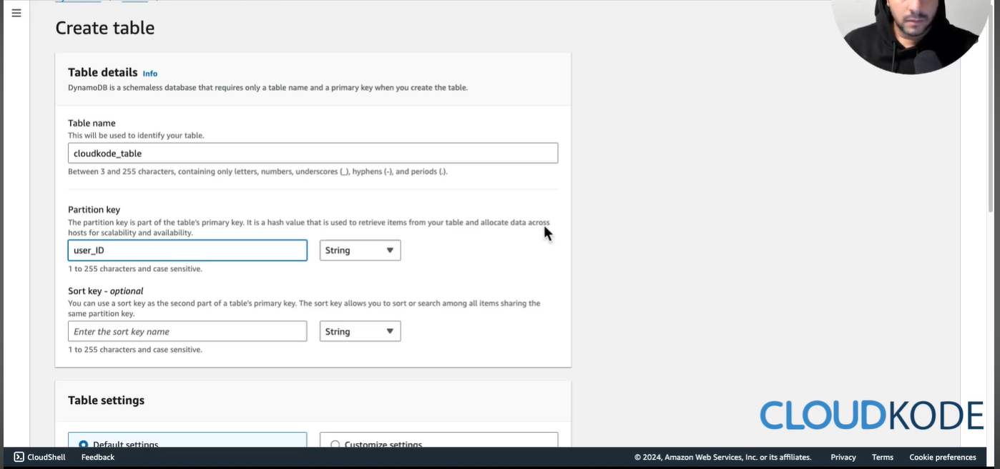

Our primary key will therefore be:

```text
ProductID
```

Example:

```text
P001
P002
P003
```

Each `ProductID` must be unique.

---

#### 3. Table Settings

For a simple lab, select:

```text
Table settings
→ Default settings
```

DynamoDB can automatically manage the required capacity.

Then click:

```text
Create table
```

Wait until the table status becomes:

```text
Active
```

---

#### 4. Add an Item

Open:

```text
DynamoDB
→ Tables
→ Products
→ Explore table items
→ Create item
```

Create the first product:

```json
{
  "ProductID": "P001",
  "ProductName": "Laptop",
  "Category": "Electronics",
  "Price": 1200,
  "Stock": 10
}
```

Click:

```text
Create item
```

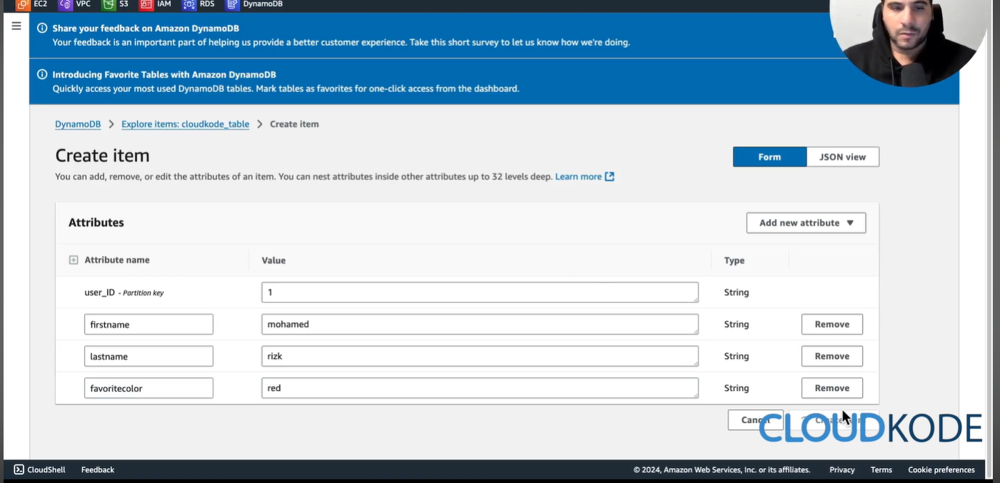


---

#### 5. Add More Products

Second item:

```json
{
  "ProductID": "P002",
  "ProductName": "Mouse",
  "Category": "Electronics",
  "Price": 25,
  "Stock": 50
}
```

Third item:

```json
{
  "ProductID": "P003",
  "ProductName": "Office Chair",
  "Category": "Furniture",
  "Price": 180,
  "Stock": 15
}
```

Now the table contains:

```text
Products

P001 → Laptop
P002 → Mouse
P003 → Office Chair
```

---

#### 6. Read an Item

Suppose the application wants information about:

```text
ProductID = P001
```

DynamoDB can retrieve the item using the partition key.

Result:

```json
{
  "ProductID": "P001",
  "ProductName": "Laptop",
  "Category": "Electronics",
  "Price": 1200,
  "Stock": 10
}
```

Conceptually:

```text
Application
     |
     | ProductID = P001
     v
DynamoDB Products Table
     |
     v
Laptop Information
```

---

#### 7. Update an Item

Suppose someone buys one laptop.

Current stock:

```text
10
```

New stock:

```text
9
```

Open the item and update:

```json
"Stock": 9
```

The record becomes:

```json
{
  "ProductID": "P001",
  "ProductName": "Laptop",
  "Category": "Electronics",
  "Price": 1200,
  "Stock": 9
}
```

---

#### 8. Delete an Item

Suppose product `P003` is no longer sold.

Select:

```text
ProductID = P003
```

Then:

```text
Actions
→ Delete item
```

Now the product is removed from DynamoDB.

---

#### 9. CRUD Operations

This small project demonstrates the main database operations:

```text
CREATE
Create a new product

READ
Retrieve product information

UPDATE
Change price or stock

DELETE
Remove a product
```

These operations are normally called:

```text
CRUD
```

---

#### 10. Why DynamoDB?

DynamoDB is useful for this application because it is:

```text
Serverless
Fast
Highly scalable
Fully managed
No server administration
Automatically replicated by AWS
```

Unlike Amazon RDS, we do not manage:

```text
Database servers
Operating systems
Database engines
Patching
Storage provisioning
```

AWS manages the infrastructure.

---

#### 11. Important DynamoDB Concept

DynamoDB is a:

```text
NoSQL Key-Value / Document Database
```

Our table structure is:

```text
Products
   |
   +-- P001
   |     ├── ProductName
   |     ├── Category
   |     ├── Price
   |     └── Stock
   |
   +-- P002
   |     ├── ProductName
   |     ├── Category
   |     ├── Price
   |     └── Stock
   |
   +-- P003
         ├── ProductName
         ├── Category
         ├── Price
         └── Stock
```

The important design decision is:

```text
Partition Key = ProductID
```

because DynamoDB uses the partition key to locate data efficiently.

---

#### 12. Final Architecture

```text
                Customer
                   |
                   v
             Web Application
                   |
                   v
              AWS Backend
                   |
                   v
        +----------------------+
        |      DynamoDB        |
        |                      |
        | Products Table       |
        |                      |
        | P001 → Laptop        |
        | P002 → Mouse         |
        | P003 → Office Chair  |
        +----------------------+
```

---

#### 13. Summary

In this case study we created:

```text
DynamoDB Table:
Products

Partition Key:
ProductID
```

And stored product information such as:

```text
ProductID
ProductName
Category
Price
Stock
```

The application can then perform:

```text
Create
Read
Update
Delete
```

The main idea is:

```text
Application
     |
     v
DynamoDB
     |
     v
Fast serverless NoSQL storage
```

Amazon DynamoDB is therefore a strong choice for applications that require **low-latency, scalable, serverless NoSQL storage**.


### Amazon Aurora Practical Case Study


# **5. Non-EC2 compute services**



AWS provides several compute services where you do not need to directly create and manage traditional EC2 virtual machines.

## 1. AWS Lambda

**AWS Lambda** is a **serverless compute service** that runs code without requiring you to provision or manage servers.

* Event-driven execution
* Automatically scales
* Pay for the compute resources consumed
* Commonly used for APIs, automation, file processing, and event-driven applications


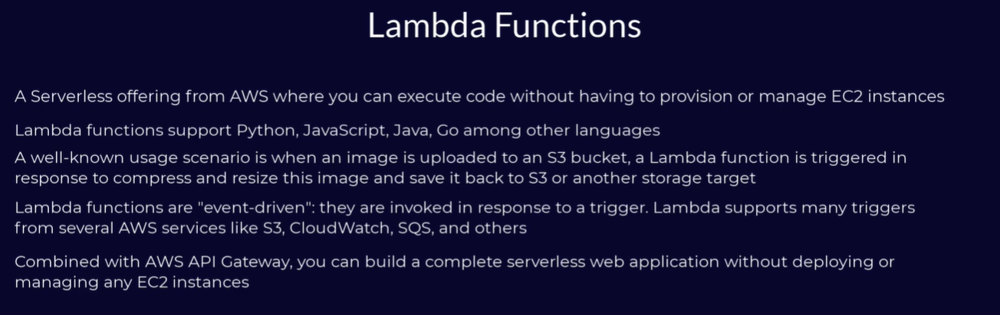

**Example:**

```text
S3 Upload
   ↓
Lambda Function
   ↓
Process File
   ↓
DynamoDB
```

---

## 2. Amazon ECS

**Amazon Elastic Container Service (ECS)** is AWS's native **container orchestration service**.

It manages the deployment and scaling of containers.

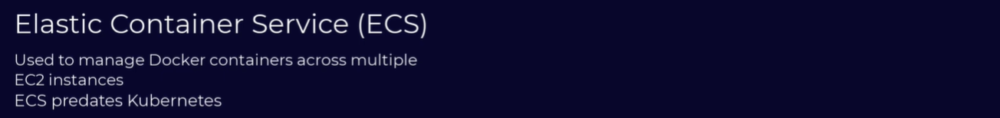

ECS containers can run using:

```text
ECS
├── EC2 Launch Type
└── AWS Fargate
```

With **Fargate**, you do not manage the underlying servers.

---

## 3. Amazon EKS

**Amazon Elastic Kubernetes Service (EKS)** is AWS's managed **Kubernetes** service.

AWS manages the Kubernetes control plane while applications run as Kubernetes workloads.

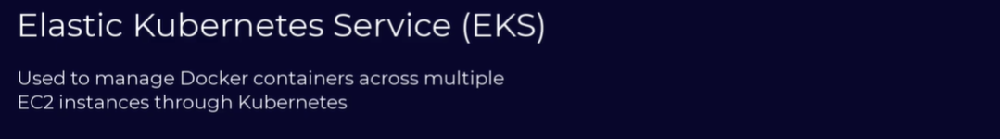


Common use cases:

* Microservices
* Containerized enterprise applications
* Applications already using Kubernetes
* Multi-cloud or Kubernetes-standard architectures

---

## 4. AWS Fargate

**AWS Fargate** provides **serverless compute for containers**.

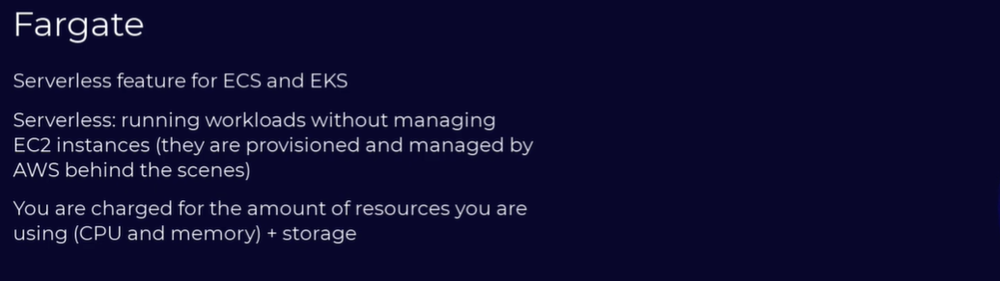

It works primarily with:

```text
Amazon ECS
Amazon EKS
```

Instead of selecting and managing EC2 instances, you specify resources such as:

```text
CPU
Memory
Container Image
Networking
IAM permissions
```

AWS handles the underlying compute infrastructure.

**Simple comparison:**

```text
ECS / EKS = Container orchestration
Fargate   = Compute engine that runs the containers
```

---
````markdown
## 5. Amazon ECR

**Amazon Elastic Container Registry (ECR)** is AWS's managed **container image registry**.

It is used to store, manage, scan, and distribute container images.

> ECR is **not a compute service itself**, but it is commonly used with ECS, EKS, and Fargate.


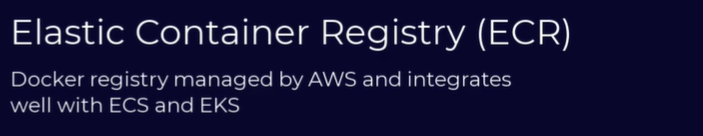

### Typical Workflow

```text
Application Code
      ↓
Build Docker Image
      ↓
Push Image to ECR
      ↓
ECS / EKS / Fargate
      ↓
Run Container
````

### Main Features

* Private and public container repositories
* Integration with ECS, EKS, and Fargate
* Image versioning using tags
* Image vulnerability scanning
* IAM-based access control
* Encryption
* Lifecycle policies for old images

### Easy Way to Remember

```text
ECR     = Store container images
ECS     = Manage containers
EKS     = Manage Kubernetes containers
Fargate = Run containers without managing servers
```

### Container Workflow

```text
Developer
   ↓
Docker Image
   ↓
Amazon ECR
   ↓
ECS / EKS
   ↓
EC2 or Fargate
   ↓
Running Application
```

```
```


---

## 6. AWS Batch

**AWS Batch** is a managed service for running **batch-processing workloads at scale**.

Typical workloads include:

* Data processing
* Scientific calculations
* Machine-learning jobs
* Rendering
* Large scheduled processing jobs


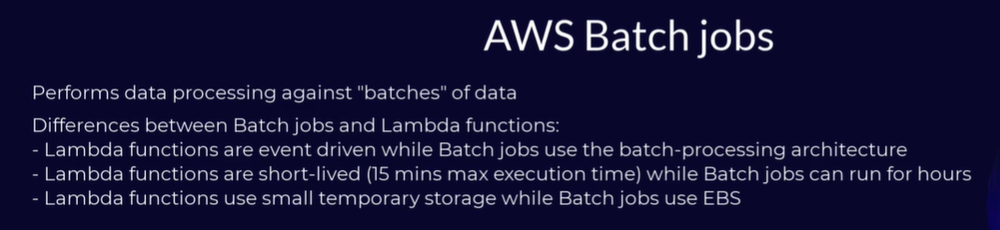


AWS Batch manages:

```text
Job
 ↓
Job Queue
 ↓
Compute Environment
 ↓
ECS / EKS / Fargate / EC2
```

It automatically schedules and scales compute resources based on workload demand.

---

## 7. AWS App Runner

**AWS App Runner** is a fully managed service for deploying **web applications and APIs** from application source code or container images.

AWS automatically handles:

* Deployment
* Scaling
* Load balancing
* HTTPS
* Infrastructure management

It is useful when developers want to deploy an application without managing servers or container orchestration.

```text
Source Code / Container Image
            ↓
       AWS App Runner
            ↓
      Running Web App
```

---

## 8. AWS Elastic Beanstalk

**AWS Elastic Beanstalk** is a managed application deployment service.

You upload your application and AWS handles much of the infrastructure configuration, including:

* EC2 provisioning
* Load balancing
* Auto Scaling
* Application deployment
* Health monitoring

```text
Application Code
       ↓
Elastic Beanstalk
       ↓
EC2 + Auto Scaling + Load Balancer
```

> Elastic Beanstalk simplifies EC2 management but normally still uses EC2 resources underneath.

---

## 9. Amazon Lightsail

**Amazon Lightsail** provides simplified cloud compute for small applications and websites.


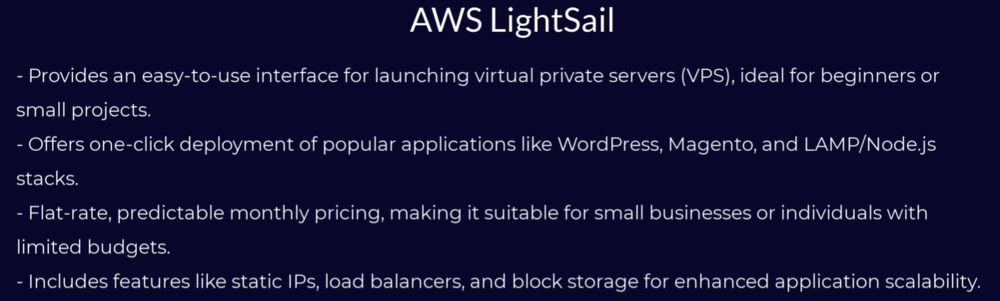

It bundles resources such as:

* Virtual server
* Storage
* Networking
* Static IP
* DNS
* Load balancing

Common use cases:

* Personal websites
* WordPress
* Small business applications
* Development environments

It is simpler than managing the equivalent infrastructure directly through EC2.

---



## Quick Comparison

| Service               | Main Purpose                    | Server Management      |
| --------------------- | ------------------------------- | ---------------------- |
| **Lambda**            | Run functions/code              | None                   |
| **ECS**               | Container orchestration         | Depends on launch type |
| **EKS**               | Managed Kubernetes              | Partial                |
| **Fargate**           | Serverless containers           | None                   |
| **Batch**             | Batch-processing jobs           | Mostly managed         |
| **App Runner**        | Deploy web apps/APIs            | None                   |
| **Elastic Beanstalk** | Deploy traditional applications | AWS manages much of it |
| **Lightsail**         | Simple VPS/application hosting  | Simplified             |

### Easy Way to Remember

```text
Need a VM?                 → EC2 / Lightsail
Need to run code only?     → Lambda
Need Docker containers?    → ECS
Need Kubernetes?           → EKS
Need serverless containers?→ Fargate
Need batch jobs?           → AWS Batch
Need simple web/API deploy?→ App Runner
Need managed app platform? → Elastic Beanstalk
```


## **4. Identity and Access Management (IAM)**


## **4. Identity and Access Management (IAM)**


## **4. Identity and Access Management (IAM)**


## **4. Identity and Access Management (IAM)**
